# Initialise Spark context

In [1]:
#def init_spark():
    import pyspark
    from pyspark import SparkConf, SparkContext
    from pyspark.sql import SparkSession
    import pyspark.sql.functions as F

    # start the session
    conf = SparkConf().setAppName('*')
    conf.set('spark.driver.cores', '5')
    conf.set('spark.driver.memory', '40G')
    conf.set('spark.driver.maxResultSize', '40G')
    conf.set('spark.executor.cores', '10')
    conf.set('spark.executor.instances', '20')
    conf.set('spark.executor.memory', '40G')
    conf.set('spark.executor.memoryOverhead', '10G')
    conf.set('spark.kryoserializer.buffer.max', '2047')
    conf.set('spark.locality.wait', '0')
    conf.set('spark.port.maxRetries', '128')
    conf.set('spark.scheduler.minRegisteredResourcesRatio', '1')
    conf.set('spark.network.timeout', '500')
    conf.set('spark.dynamicAllocation.enabled', 'False')
    conf.set('spark.shuffle.service.enabled', 'False')
    conf.set('spark.sql.legacy.allowCreatingManagedTableUsingNonemptyLocation', 'True')
    conf.set("spark.sql.broadcastTimeout", "1800")
    sc = SparkContext(conf = conf)
    spark = SparkSession(sc)


# Imports

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from pyspark.sql.functions import col
from pyspark.sql import DataFrame
from pyspark.sql.functions import col, count, approx_count_distinct
import re
from pyspark.sql.functions import to_date, col, regexp_replace

#Smote
from imblearn.over_sampling import SMOTE
# Statistics
from scipy.stats import chi2_contingency
#sklearn
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, roc_curve
# Import the split function from sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler

In [3]:
source_csv_file = 'Churndata_2023-11.csv'
load_df = spark.read.csv('{csv_file}'.format(csv_file=source_csv_file), header=True, sep=';', inferSchema= True)

In [4]:
load_df.printSchema()

root
 |-- msisdn: integer (nullable = true)
 |-- vas_code: string (nullable = true)
 |-- actual_premium: integer (nullable = true)
 |-- Tenure: integer (nullable = true)
 |-- 1Yr_Loss_Ratio: string (nullable = true)
 |-- 3Yr_Loss_Ratio: string (nullable = true)
 |-- 1Yr_LR_band: string (nullable = true)
 |-- 3Yr_LR_band: string (nullable = true)
 |-- LR_Increase: string (nullable = true)
 |-- TP_2: string (nullable = true)
 |-- PSR_2: string (nullable = true)
 |-- PSR_2_Increase_Loading: string (nullable = true)
 |-- Premium Increase: string (nullable = true)
 |-- New_Premium_2: string (nullable = true)
 |-- Segment: string (nullable = true)
 |-- New_Premium_PSR: string (nullable = true)
 |-- monetary increase: string (nullable = true)
 |-- lsm: string (nullable = true)
 |-- PolicyMakeMapped: string (nullable = true)
 |-- SI_Band: string (nullable = true)
 |-- Count_TH_LO: integer (nullable = true)
 |-- Count_AD_Repair: integer (nullable = true)
 |-- Gendr_Cd: string (nullable = true)


In [5]:
for old_col in load_df.columns:
    new_col = old_col.lower().replace(" ", "_")
    load_df = load_df.withColumnRenamed(old_col, new_col)

In [6]:
load_df.printSchema()

root
 |-- msisdn: integer (nullable = true)
 |-- vas_code: string (nullable = true)
 |-- actual_premium: integer (nullable = true)
 |-- tenure: integer (nullable = true)
 |-- 1yr_loss_ratio: string (nullable = true)
 |-- 3yr_loss_ratio: string (nullable = true)
 |-- 1yr_lr_band: string (nullable = true)
 |-- 3yr_lr_band: string (nullable = true)
 |-- lr_increase: string (nullable = true)
 |-- tp_2: string (nullable = true)
 |-- psr_2: string (nullable = true)
 |-- psr_2_increase_loading: string (nullable = true)
 |-- premium_increase: string (nullable = true)
 |-- new_premium_2: string (nullable = true)
 |-- segment: string (nullable = true)
 |-- new_premium_psr: string (nullable = true)
 |-- monetary_increase: string (nullable = true)
 |-- lsm: string (nullable = true)
 |-- policymakemapped: string (nullable = true)
 |-- si_band: string (nullable = true)
 |-- count_th_lo: integer (nullable = true)
 |-- count_ad_repair: integer (nullable = true)
 |-- gendr_cd: string (nullable = true)


In [7]:
load_df = load_df.drop("msisdn")
load_df = load_df.drop("msisdn26")
load_df = load_df.drop("policyvascode")
load_df = load_df.drop("policyinceptiondate2")
load_df = load_df.drop("policyinceptiondate35")
load_df = load_df.drop("thlo_acpc_expected")
load_df = load_df.drop("ad_repair_acpc_expected")
load_df = load_df.drop("ad_replace_acpc_expected")
load_df = load_df.drop("policyym")
load_df = load_df.drop("monthlypremium")
load_df = load_df.drop("age")
load_df = load_df.drop("lsm2")
load_df = load_df.drop("upgrade_date")
load_df = load_df.drop("target_date_of_increase")



In [8]:
load_df = load_df.withColumnRenamed("target_date_of_increase_", "target_date_of_increase")
load_df = load_df.withColumnRenamed("policymakemapped", "policy_make_mapped")
load_df = load_df.withColumnRenamed("insuredvalue", "insured_value")
load_df = load_df.withColumnRenamed("perilfilter", "peril_filter")
load_df = load_df.withColumnRenamed("tenuregroup", "tenure_group")
load_df = load_df.withColumnRenamed("mapage", "map_age")
load_df = load_df.withColumnRenamed("policymakesiband", "policy_make_si_band")
load_df = load_df.withColumnRenamed("1yr_loss_ratio", "one_yr_loss_ratio")
load_df = load_df.withColumnRenamed("3yr_loss_ratio", "three_yr_loss_ratio")
load_df = load_df.withColumnRenamed("1yr_lr_band", "one_yr_lr_band")
load_df = load_df.withColumnRenamed("3yr_lr_band", "three_yr_lr_band")
load_df = load_df.withColumnRenamed("1yrall", "one_yr_all")
load_df = load_df.withColumnRenamed("3yrall", "three_yr_all")
load_df = load_df.withColumnRenamed("5yrall", "five_yr_all")
load_df = load_df.withColumnRenamed("1yrclaims", "one_yr_claims")
load_df = load_df.withColumnRenamed("3yrclaims", "three_yr_claims")
load_df = load_df.withColumnRenamed("5yrclaims", "five_yr_claims")
load_df = load_df.withColumnRenamed("ad_lossofsi", "ad_loss_of_si")

In [9]:
load_df.printSchema()

root
 |-- vas_code: string (nullable = true)
 |-- actual_premium: integer (nullable = true)
 |-- tenure: integer (nullable = true)
 |-- one_yr_loss_ratio: string (nullable = true)
 |-- three_yr_loss_ratio: string (nullable = true)
 |-- one_yr_lr_band: string (nullable = true)
 |-- three_yr_lr_band: string (nullable = true)
 |-- lr_increase: string (nullable = true)
 |-- tp_2: string (nullable = true)
 |-- psr_2: string (nullable = true)
 |-- psr_2_increase_loading: string (nullable = true)
 |-- premium_increase: string (nullable = true)
 |-- new_premium_2: string (nullable = true)
 |-- segment: string (nullable = true)
 |-- new_premium_psr: string (nullable = true)
 |-- monetary_increase: string (nullable = true)
 |-- lsm: string (nullable = true)
 |-- policy_make_mapped: string (nullable = true)
 |-- si_band: string (nullable = true)
 |-- count_th_lo: integer (nullable = true)
 |-- count_ad_repair: integer (nullable = true)
 |-- gendr_cd: string (nullable = true)
 |-- tenure_group: st

In [10]:
load_df.count()

351000

In [11]:
pandas_df = load_df.toPandas()

In [12]:
s = pandas_df

In [13]:
pandas_df.head()

,vas_code,actual_premium,tenure,one_yr_loss_ratio,three_yr_loss_ratio,one_yr_lr_band,three_yr_lr_band,lr_increase,tp_2,psr_2,...,three_yr_claims,five_yr_claims,net_th_lo,net_ad_repair,net_ad_replace,ad_loss_of_si,map_age,policy_make_si_band,insured_value,cancellation_check
0,VIC01,346,29,0,0,a: 0 to 20%,a: 0 to 20%,0,"131,6987147","2,627208632",...,0.0,0.0,0.0,0.0,0.0,0,81 to 90,Apple_30000 to 99999,23293.973595,0
1,IC08,221,5,0,0,a: 0 to 20%,a: 0 to 20%,0,"318,307609","0,694296943",...,0.0,0.0,0.0,0.0,0.0,0,41 to 50,Apple_20000 to 25000,15879.702051,0
2,VIC01,364,29,0,0,a: 0 to 20%,a: 0 to 20%,0,"147,2188878","2,472508829",...,0.0,0.0,0.0,0.0,0.0,0,51 to 60,Samsung_15000 to 20000,12422.679742,0
3,VIC01,107,18,"4,335825545","2,890550363",f: 100%+,f: 100%+,"0,07","184,7814566","0,579062434",...,0.0,0.0,0.0,0.0,0.0,0,41 to 50,Huawei_7500 to 10000,5823.499222,0
4,VIC01,74,11,0,0,a: 0 to 20%,a: 0 to 20%,0,"233,7753435","0,31654322",...,0.0,0.0,0.0,0.0,0.0,0,41 to 50,Apple_20000 to 25000,15529.318318,0


In [14]:
pandas_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 351000 entries, 0 to 350999
Data columns (total 46 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   vas_code                        351000 non-null  object 
 1   actual_premium                  351000 non-null  int32  
 2   tenure                          351000 non-null  int32  
 3   one_yr_loss_ratio               351000 non-null  object 
 4   three_yr_loss_ratio             351000 non-null  object 
 5   one_yr_lr_band                  351000 non-null  object 
 6   three_yr_lr_band                351000 non-null  object 
 7   lr_increase                     351000 non-null  object 
 8   tp_2                            348437 non-null  object 
 9   psr_2                           348437 non-null  object 
 10  psr_2_increase_loading          348437 non-null  object 
 11  premium_increase                351000 non-null  object 
 12  new_premium_2   

In [18]:
#converting to strings

# str_colums = ["msisdn", 'lsm']

# # Converting to int format
# for col_name in str_colums:
#     pandas_df[col_name] = pandas_df[str_colums].astype(object)

In [15]:
# int_columns = [ "actual_premium", "tenure" , "cancellation_check"]
# # Converting to int format
# for col_name in int_columns:
#     pandas_df[col_name] = pandas_df[col_name].astype(int)

In [15]:
flt_columns = ["one_yr_loss_ratio", "three_yr_loss_ratio", "lr_increase", "tp_2", "psr_2", "psr_2_increase_loading", \
               "premium_increase", "new_premium_2", "new_premium_psr", "monetary_increase", "gross_ad_repair", \
               "gross_ad_replace", "gross_th_lo", "gross_ad", "ad_loss_of_si"]

# Converting to float format
for col_name in flt_columns:
    pandas_df[col_name] = pandas_df[col_name].str.replace(',', '.').astype(float)

In [100]:
# Converting date columns to the specified date format
# date_columns = ["upgrade_date", "target_date_of_increase"]

# for col_name in date_columns:
#     pandas_df[col_name] = pd.to_datetime(pandas_df[col_name], format="%Y/%m/%d")

In [16]:
pandas_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 351000 entries, 0 to 350999
Data columns (total 46 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   vas_code                        351000 non-null  object 
 1   actual_premium                  351000 non-null  int32  
 2   tenure                          351000 non-null  int32  
 3   one_yr_loss_ratio               351000 non-null  float64
 4   three_yr_loss_ratio             351000 non-null  float64
 5   one_yr_lr_band                  351000 non-null  object 
 6   three_yr_lr_band                351000 non-null  object 
 7   lr_increase                     351000 non-null  float64
 8   tp_2                            348437 non-null  float64
 9   psr_2                           348437 non-null  float64
 10  psr_2_increase_loading          348437 non-null  float64
 11  premium_increase                351000 non-null  float64
 12  new_premium_2   

In [17]:
pandas_df.shape

(351000, 46)

In [18]:
pandas_df.count()

vas_code                          351000
actual_premium                    351000
tenure                            351000
one_yr_loss_ratio                 351000
three_yr_loss_ratio               351000
one_yr_lr_band                    351000
three_yr_lr_band                  351000
lr_increase                       351000
tp_2                              348437
psr_2                             348437
psr_2_increase_loading            348437
premium_increase                  351000
new_premium_2                     351000
segment                           351000
new_premium_psr                   351000
monetary_increase                 351000
lsm                               324768
policy_make_mapped                351000
si_band                           350994
count_th_lo                       351000
count_ad_repair                   351000
gendr_cd                          351000
tenure_group                      351000
most_used_prov                    347473
dmuc_24h_distnct

In [19]:
pandas_df.isnull().sum()

vas_code                              0
actual_premium                        0
tenure                                0
one_yr_loss_ratio                     0
three_yr_loss_ratio                   0
one_yr_lr_band                        0
three_yr_lr_band                      0
lr_increase                           0
tp_2                               2563
psr_2                              2563
psr_2_increase_loading             2563
premium_increase                      0
new_premium_2                         0
segment                               0
new_premium_psr                       0
monetary_increase                     0
lsm                               26232
policy_make_mapped                    0
si_band                               6
count_th_lo                           0
count_ad_repair                       0
gendr_cd                              0
tenure_group                          0
most_used_prov                     3527
dmuc_24h_distnct_cell_site_qty     1500


In [20]:
pandas_df['cancellation_check'].value_counts()

0    335097
1     15903
Name: cancellation_check, dtype: int64

In [21]:
pandas_dfna = pandas_df.dropna()

In [22]:
pandas_dfna['cancellation_check'].value_counts()

0    307367
1     14067
Name: cancellation_check, dtype: int64

In [23]:
pandas_df = pandas_df.fillna(pandas_df.median())

In [24]:
pandas_df.isnull().sum()

vas_code                              0
actual_premium                        0
tenure                                0
one_yr_loss_ratio                     0
three_yr_loss_ratio                   0
one_yr_lr_band                        0
three_yr_lr_band                      0
lr_increase                           0
tp_2                                  0
psr_2                                 0
psr_2_increase_loading                0
premium_increase                      0
new_premium_2                         0
segment                               0
new_premium_psr                       0
monetary_increase                     0
lsm                               26232
policy_make_mapped                    0
si_band                               6
count_th_lo                           0
count_ad_repair                       0
gendr_cd                              0
tenure_group                          0
most_used_prov                     3527
dmuc_24h_distnct_cell_site_qty     1500


In [25]:
pandas_df = pandas_df.apply(lambda x: x.fillna(x.value_counts().index[0]))

In [26]:
pandas_df.isnull().sum()

vas_code                          0
actual_premium                    0
tenure                            0
one_yr_loss_ratio                 0
three_yr_loss_ratio               0
one_yr_lr_band                    0
three_yr_lr_band                  0
lr_increase                       0
tp_2                              0
psr_2                             0
psr_2_increase_loading            0
premium_increase                  0
new_premium_2                     0
segment                           0
new_premium_psr                   0
monetary_increase                 0
lsm                               0
policy_make_mapped                0
si_band                           0
count_th_lo                       0
count_ad_repair                   0
gendr_cd                          0
tenure_group                      0
most_used_prov                    0
dmuc_24h_distnct_cell_site_qty    0
count_ad_replace                  0
peril_filter                      0
count_ad                    

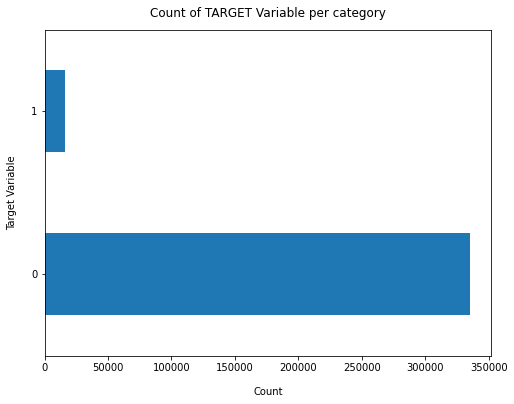

In [27]:
pandas_df['cancellation_check'].value_counts().plot(kind='barh', figsize=(8, 6))
plt.xlabel("Count", labelpad=14)
plt.ylabel("Target Variable", labelpad=14)
plt.title("Count of TARGET Variable per category", y=1.02);

In [28]:
pandas_df.describe()

,actual_premium,tenure,one_yr_loss_ratio,three_yr_loss_ratio,lr_increase,tp_2,psr_2,psr_2_increase_loading,premium_increase,new_premium_2,...,three_yr_all,one_yr_claims,three_yr_claims,five_yr_claims,net_th_lo,net_ad_repair,net_ad_replace,ad_loss_of_si,insured_value,cancellation_check
count,351000.000000,351000.000000,351000.000000,351000.000000,351000.000000,3.510000e+05,3.510000e+05,351000.000000,351000.000000,351000.000000,...,351000.000000,351000.000000,351000.000000,351000.000000,351000.000000,351000.000000,351000.000000,3.510000e+05,3.510000e+05,351000.000000
mean,122.718060,19.258678,0.482671,0.661342,0.009310,1.614071e+02,3.959940e+03,0.005545,0.094818,134.603356,...,0.040553,99.588422,115.234274,123.404121,48.446227,14.850625,7.797470,1.387009e+01,7.883351e+03,0.045308
std,87.579953,13.519204,2.392993,3.371648,0.021073,1.685498e+02,4.105050e+05,0.005621,0.022347,96.406541,...,0.434138,1330.633526,1592.108607,1715.389805,748.758395,307.464838,292.287423,5.224161e+03,6.631090e+03,0.207978
min,1.000000,0.000000,0.000000,0.000000,0.000000,1.903740e-07,6.118765e-03,0.000000,0.080000,1.170000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,6.599987e-03,0.000000
25%,60.000000,8.000000,0.000000,0.000000,0.000000,5.415277e+01,6.120128e-01,0.000000,0.080000,66.600000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,3.771644e+03,0.000000
50%,100.000000,17.000000,0.000000,0.000000,0.000000,1.167906e+02,8.952433e-01,0.005000,0.085000,108.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,5.793972e+03,0.000000
75%,167.000000,29.000000,0.000000,0.000000,0.000000,2.125826e+02,1.357802e+00,0.010000,0.095000,181.440000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,1.164699e+04,0.000000
max,699.000000,244.000000,408.002728,811.822847,0.070000,3.611840e+04,2.416293e+08,0.020000,0.170000,768.900000,...,18.000000,121475.104348,162521.739130,174657.965217,44972.904348,20402.608696,27043.591304,2.151880e+06,1.277814e+06,1.000000


In [29]:
pandas_df.describe(include=['object'])

,vas_code,one_yr_lr_band,three_yr_lr_band,segment,lsm,policy_make_mapped,si_band,gendr_cd,tenure_group,most_used_prov,dmuc_24h_distnct_cell_site_qty,peril_filter,five_yr_all,map_age,policy_make_si_band
count,351000,351000,351000,351000,351000,351000,351000,351000,351000,351000,351000,351000,351000,351000,351000
unique,29,6,6,6,11,4,11,3,5,8,7,2,4,8,47
top,VIC01,a: 0 to 20%,a: 0 to 20%,aspiration seeker,Group 6,Samsung,5000 to 7500,F,gt 5yr,Southern Gauteng,7plus,COMP,0,41 to 50,Samsung_5000 to 7500
freq,194909,314774,277690,142031,184890,144123,83420,177456,209500,88117,110923,286084,249477,83965,34420


In [30]:
# Skew Value (x)	Description of Data
# -0.5 < x < 0.5	Fairly Symmetrical
# -1 < x < -0.5	Moderate Negative Skew
# 0.5 < x < 1	Moderate Positive Skew
# x < -1	High Negative Skew
# x > 1	High Positve Skew
pandas_df.skew()

actual_premium              1.148291
tenure                      2.141449
one_yr_loss_ratio          40.055097
three_yr_loss_ratio        62.711593
lr_increase                 2.230705
tp_2                       29.301451
psr_2                     581.037263
psr_2_increase_loading      0.499546
premium_increase            2.051852
new_premium_2               1.156793
new_premium_psr           580.709192
monetary_increase           1.659346
count_th_lo                11.799521
count_ad_repair            16.527749
count_ad_replace           28.686070
count_ad                   14.281602
gross_ad_repair            28.041761
gross_ad_replace           50.681156
gross_ad                   28.497159
gross_th_lo                21.802735
one_yr_all                 13.175713
three_yr_all               14.373207
one_yr_claims              25.261849
three_yr_claims            26.959398
five_yr_claims             26.390463
net_th_lo                  21.549231
net_ad_repair              29.013335
n

In [31]:
#High kurtosis (>3) indicates a large number of outliers and low kurtosis (<3) a lack of outliers
pandas_df.kurtosis()

actual_premium                 0.513119
tenure                        15.689718
one_yr_loss_ratio           4741.200085
three_yr_loss_ratio        10936.246019
lr_increase                    3.503781
tp_2                        5904.469153
psr_2                     341975.160815
psr_2_increase_loading        -1.074836
premium_increase               3.158439
new_premium_2                  0.556600
new_premium_psr           341715.615354
monetary_increase              3.425616
count_th_lo                  137.229474
count_ad_repair              271.168018
count_ad_replace             820.895276
count_ad                     201.965297
gross_ad_repair              972.171872
gross_ad_replace            2970.025899
gross_ad                    1041.166535
gross_th_lo                  580.855153
one_yr_all                   215.189668
three_yr_all                 259.800508
one_yr_claims               1014.547719
three_yr_claims             1188.783484
five_yr_claims              1116.790004


In [32]:
features = ['actual_premium', 'tenure', 'one_yr_loss_ratio', 'three_yr_loss_ratio',
       'lr_increase', 'tp_2', 'psr_2', 'psr_2_increase_loading',
       'premium_increase', 'new_premium_2', 'new_premium_psr',
       'monetary_increase', 'cancellation_check', 'count_th_lo',
       'count_ad_repair', 'count_ad_replace', 'insured_value', 'count_ad',
       'gross_ad_repair', 'gross_ad_replace', 'gross_th_lo', 'gross_ad',
       'one_yr_all', 'three_yr_all', 'one_yr_claims', 'three_yr_claims', 'five_yr_claims',
       'net_th_lo', 'net_ad_repair', 'net_ad_replace', 'ad_loss_of_si']

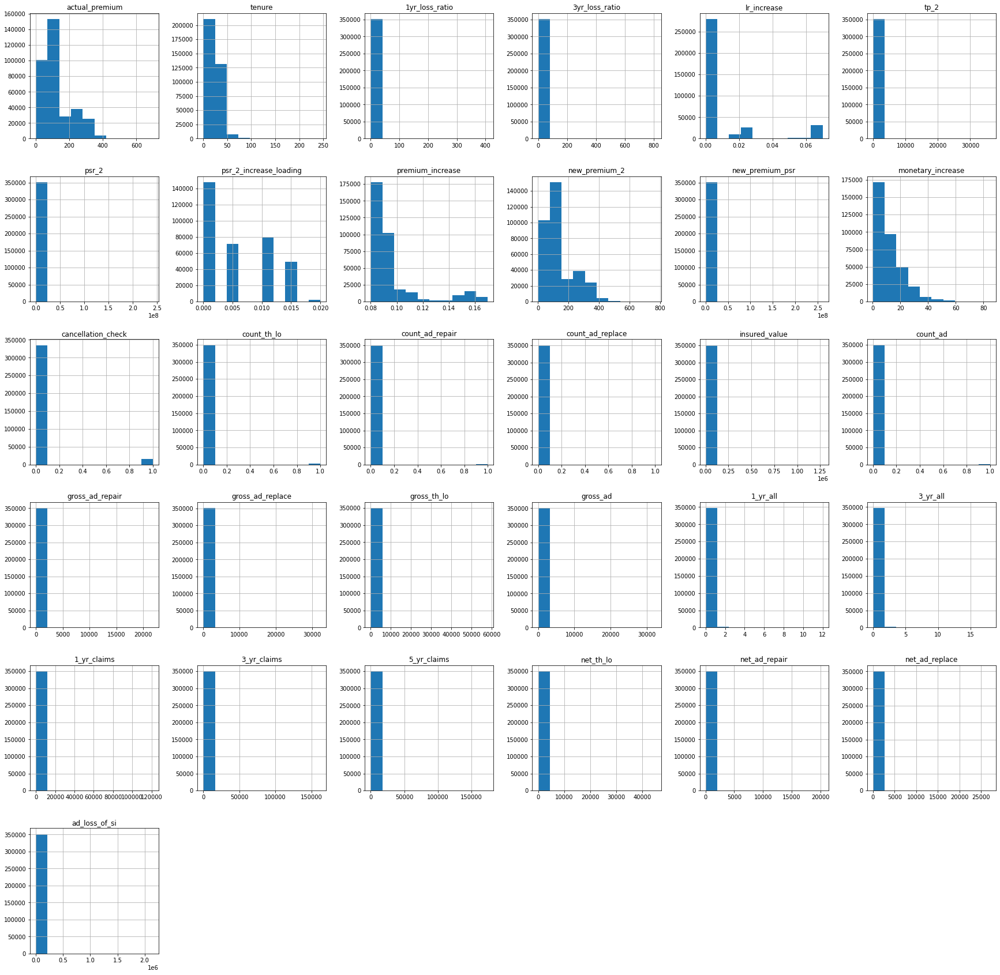

In [85]:
#features = cols = pandas_df.select_dtypes([np.number]).columns # create a list of all numerical features

pandas_df[features].hist(figsize=(30,30));

<AxesSubplot:>

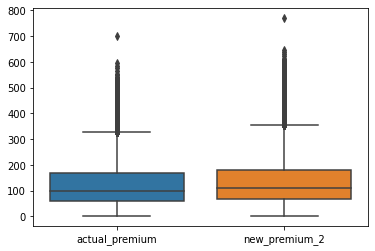

In [86]:
sns.boxplot(data=pandas_df[["actual_premium", "new_premium_2"]])

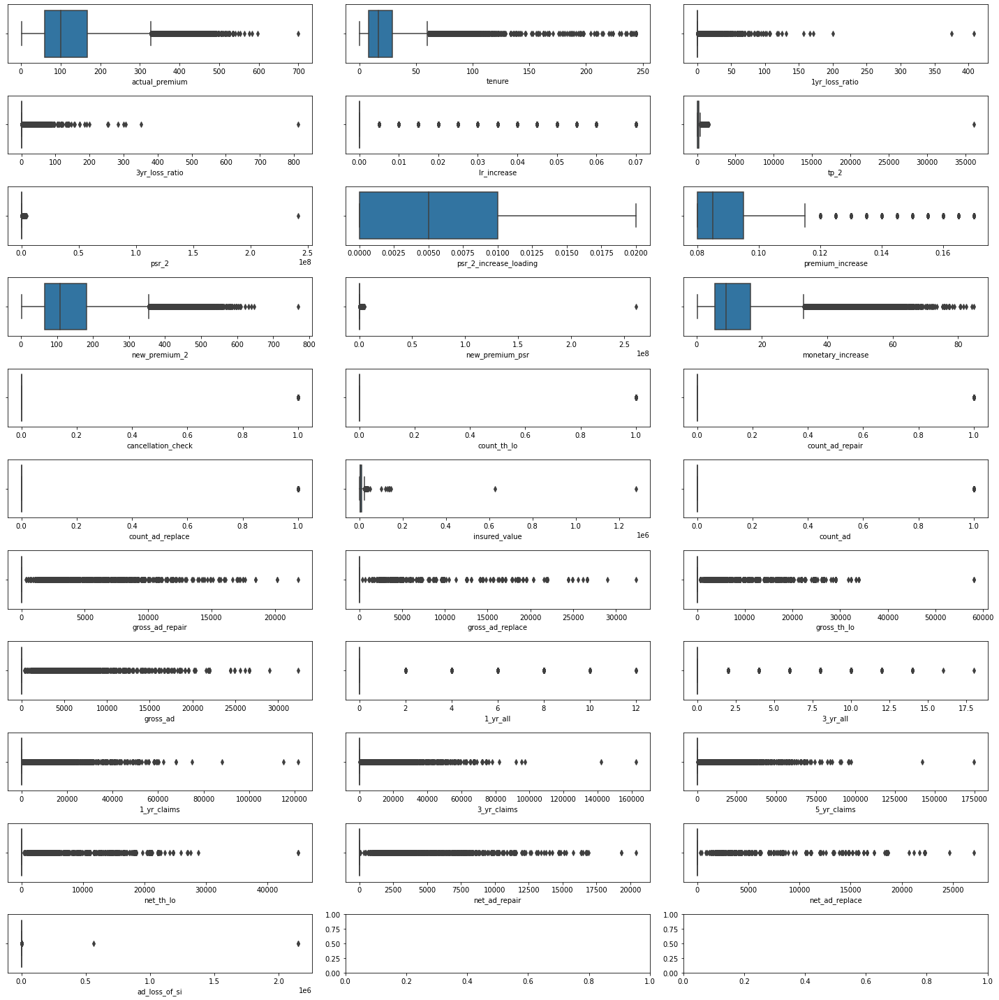

In [87]:
f, axes = plt.subplots(round(len(features)/3) + 1, 3,  figsize=(20, 20))  
y = 0;
for name in features:
    i, j = divmod(y, 3)
    sns.boxplot(x=pandas_df[name], ax=axes[i, j])
    y = y + 1

plt.tight_layout()
plt.show()

/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


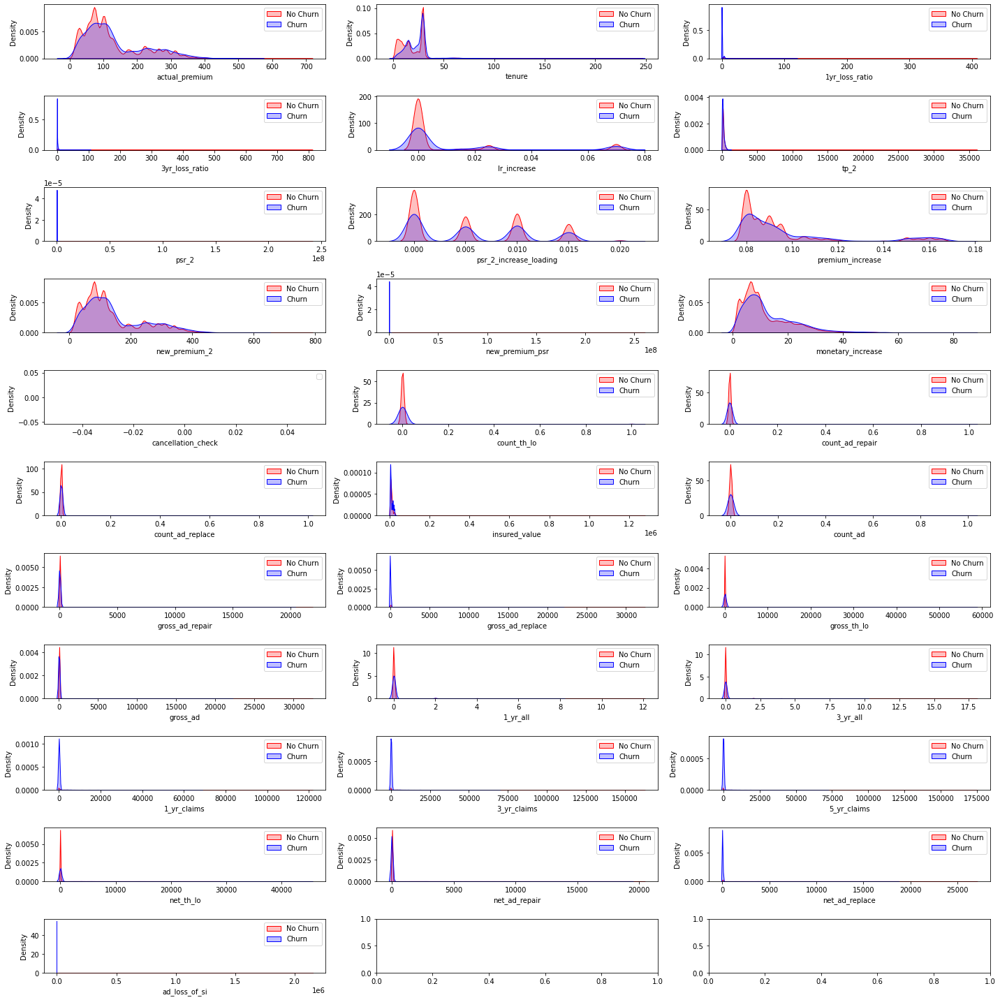

In [88]:
f, axes = plt.subplots(round(len(features)/3) + 1, 3,  figsize=(20, 20))  
y = 0;
for name in features:
    i, j = divmod(y, 3)
    #sns.boxplot(x=pandas_df[name], ax=axes[i, j])
    Mth = sns.kdeplot(x = pandas_df[name][(pandas_df["cancellation_check"] == 0) ],ax=axes[i, j], color="Red", shade = True)
    Mth = sns.kdeplot(x = pandas_df[name][(pandas_df["cancellation_check"] == 1) ], ax=axes[i, j], color="Blue", shade= True)
    Mth.legend(["No Churn","Churn"],loc='upper right')
    y = y + 1

plt.tight_layout()
plt.show()

In [35]:
# Mth = sns.kdeplot(x = pandas_df['tenure'][(pandas_df["cancellation_check"] == 0) ],
#                 color="Red", shade = True)
# Mth = sns.kdeplot(x = pandas_df['tenure'][(pandas_df["cancellation_check"] == 1) ],
#                 ax =Mth, color="Blue", shade= True)
# Mth.legend(["No Churn","Churn"],loc='upper right')
# Mth.set_ylabel('Density')
# Mth.set_xlabel('Monthly Charges')
# Mth.set_title('Monthly charges by churn')

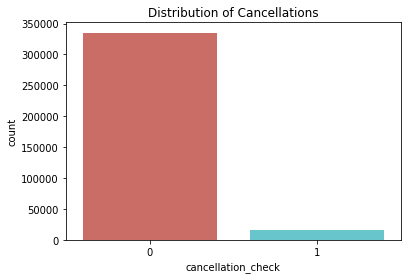

In [33]:
#Bar plot
sns.countplot(x = 'cancellation_check', data = pandas_df, palette="hls")
plt.title("Distribution of Cancellations");

In [ ]:
# features_obj = pandas_df.select_dtypes(exclude = [np.number]).columns # create a list of all numerical features
# features_obj

In [34]:
objects = [ 'vas_code', 'one_yr_lr_band','three_yr_lr_band', 'segment', 'lsm', 'policy_make_mapped', \
           'si_band', 'gendr_cd', 'tenure_group', 'most_used_prov', 
           'dmuc_24h_distnct_cell_site_qty', 'five_yr_all', 'peril_filter', 
           'map_age','policy_make_si_band']

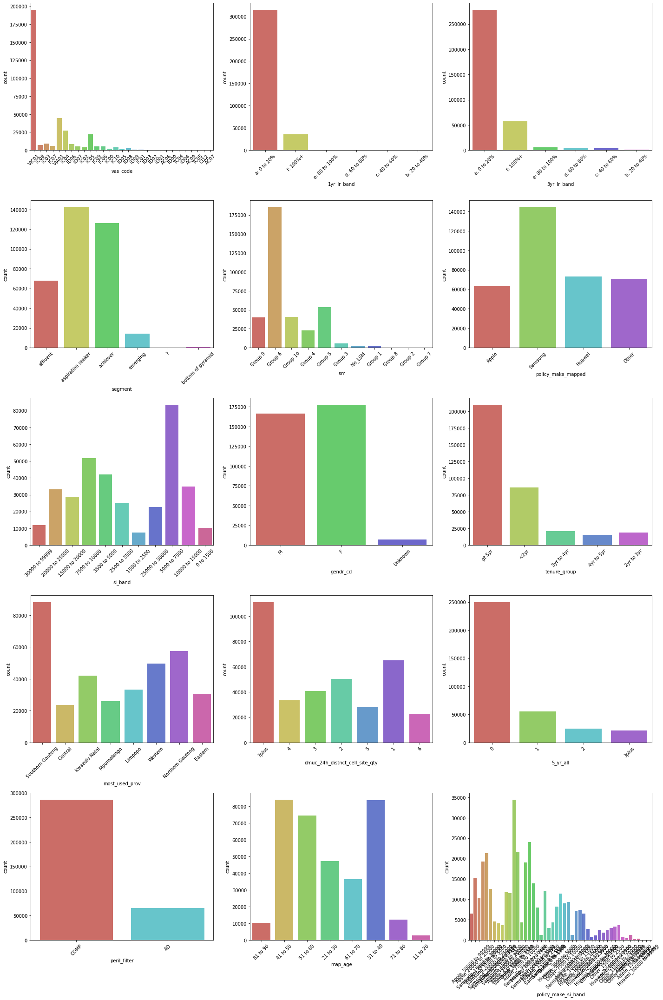

In [91]:
f, axes = plt.subplots(round(len(objects)/3), 3,  figsize=(20, 30))  
y = 0
for name in objects:
    i, j = divmod(y, 3)
    ax = sns.countplot(x = pandas_df[name], ax=axes[i, j], palette="hls")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
    y = y + 1
plt.tight_layout()
plt.show()

In [ ]:
# #Bar plot
# plt.figure(figsize=(12, 8))
# ax = sns.countplot(x = 'vas_code', data = pandas_df, palette="hls")
# ax.set_xticklabels(ax.get_xticklabels(), rotation=55)
# plt.title("Distribution of vas code ")

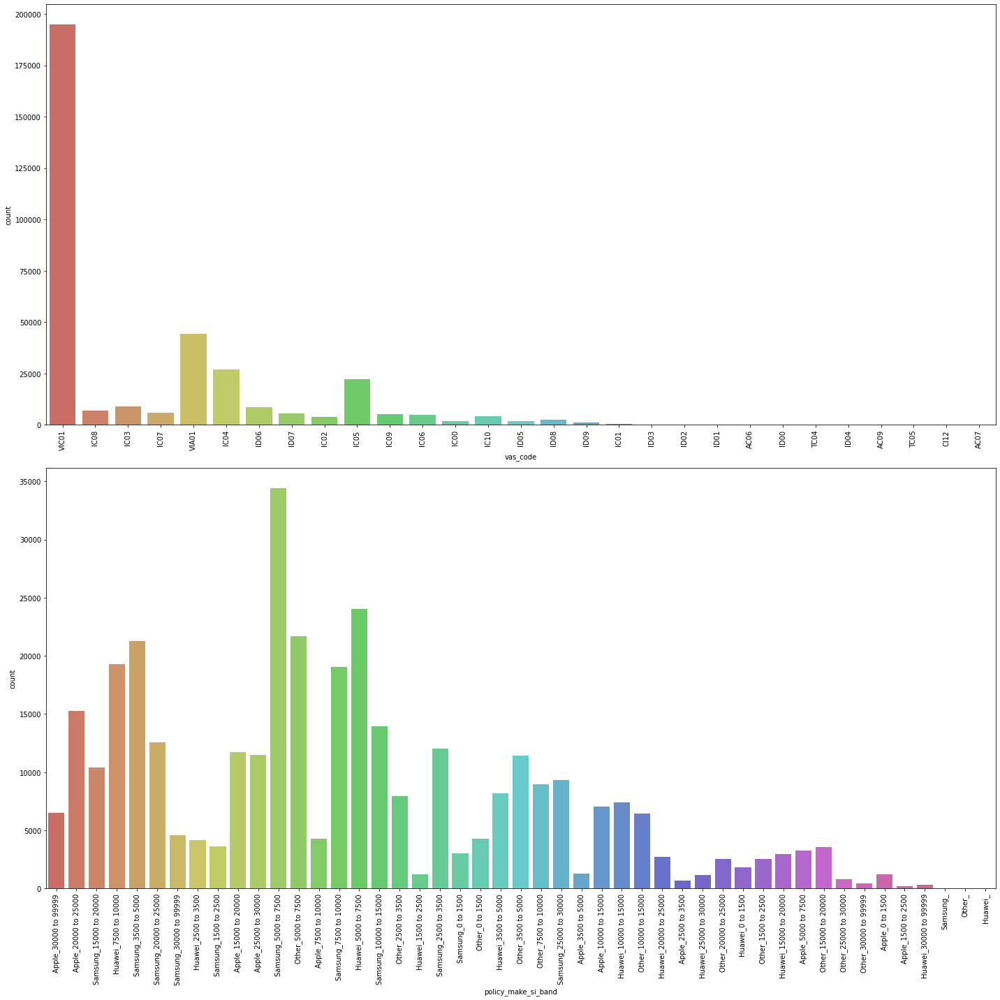

In [92]:

f, axes = plt.subplots(2,1,  figsize=(20, 20))  
y = 0;
vis_objects = ['vas_code','policy_make_si_band']
for name in vis_objects:
    ax = sns.countplot(x = pandas_df[name], ax=axes[y], palette="hls")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    y = y + 1

plt.tight_layout()
plt.show()

In [35]:
colors = ['#00A5E0', '#DD403A']
df_churned = pandas_df[pandas_df['cancellation_check'] == 1]
df_retained = pandas_df[pandas_df['cancellation_check'] == 0]

In [36]:
def plot_continuous(feature):
    '''Plot a histogram and boxplot for the churned and retained distributions for the specified feature.'''
    df_func = pandas_df.copy()
    df_func['cancellation_check'] = df_func['cancellation_check'].astype('category')
 
    fig, (ax1, ax2) = plt.subplots(2,
                                   figsize=(9, 7),
                                   sharex=True,
                                   gridspec_kw={'height_ratios': (.7, .3)})
 
    for df, color, label in zip([df_retained, df_churned], colors, ['Retained', 'Churned']):
        sns.histplot(data=df,
                     x=feature,
                     bins=15,
                     color=color,
                     alpha=0.66,
                     edgecolor='firebrick',
                     label=label,
                     kde=False,
                     ax=ax1)
    ax1.legend()
 
    sns.boxplot(x=feature, y='cancellation_check', data=df_func, palette=colors, ax=ax2)
    ax2.set_ylabel('')
    ax2.set_yticklabels(['Retained', 'Churned'])
 
    plt.tight_layout();

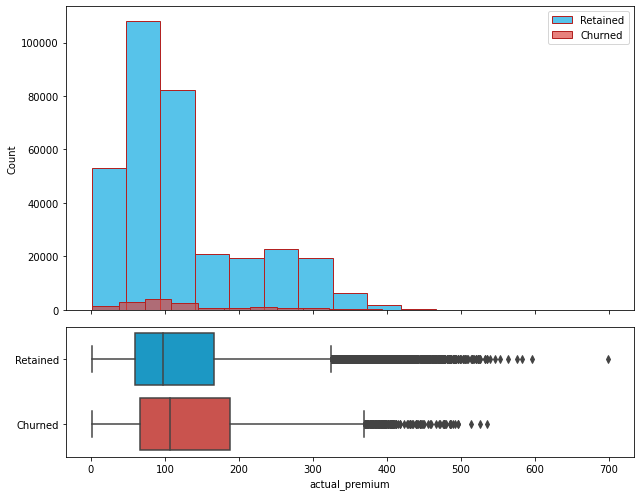

In [37]:
plot_continuous('actual_premium')

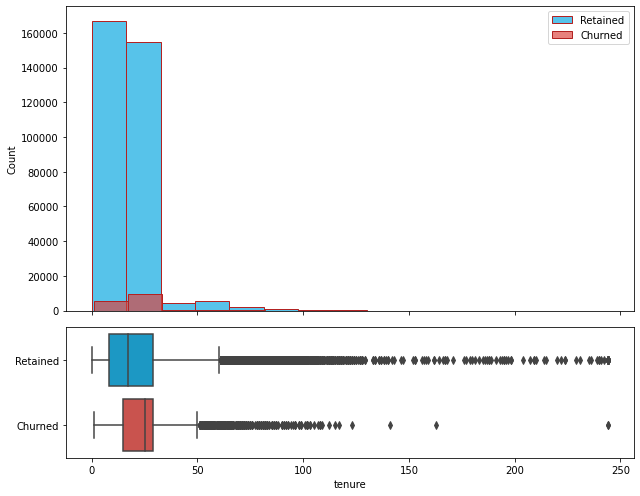

In [38]:
plot_continuous('tenure')

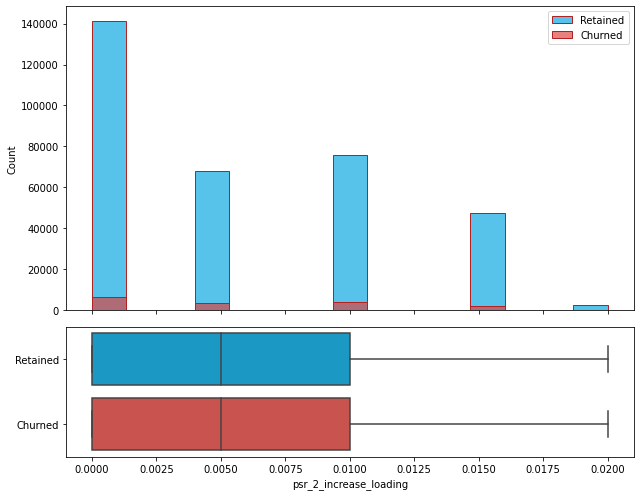

In [39]:
plot_continuous('psr_2_increase_loading')

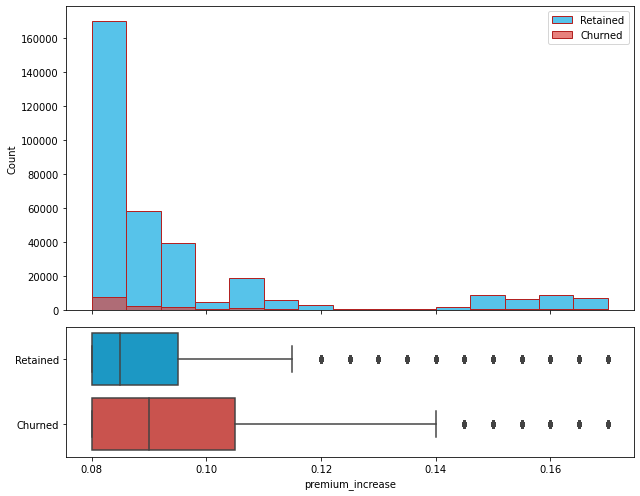

In [40]:
plot_continuous('premium_increase')

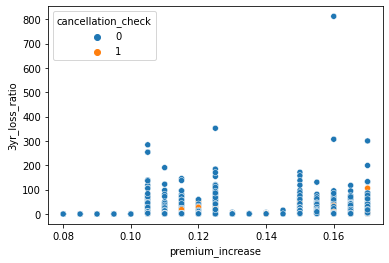

In [41]:
sns.scatterplot(x='premium_increase',y='3yr_loss_ratio',hue='cancellation_check', data=pandas_df);

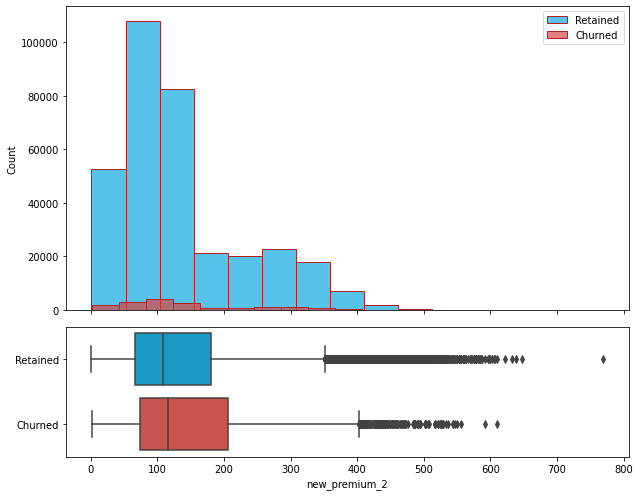

In [42]:
plot_continuous('new_premium_2')

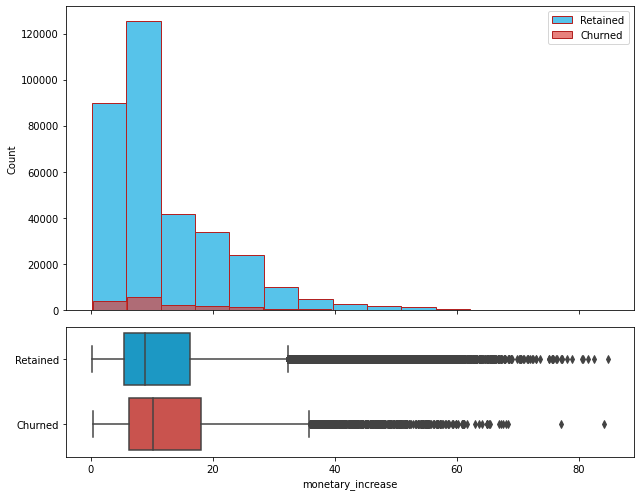

In [43]:
plot_continuous('monetary_increase')

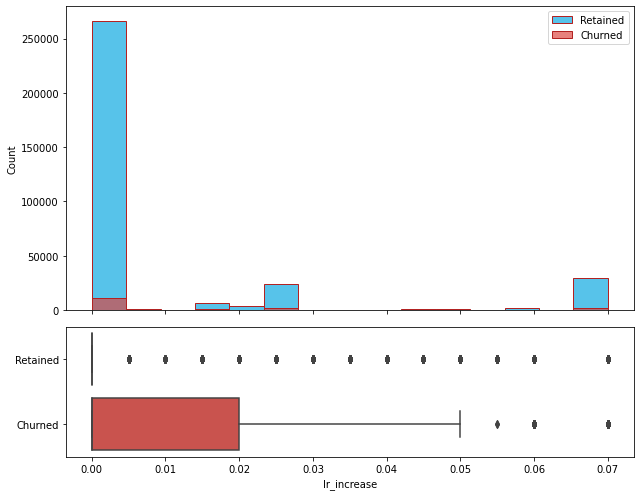

In [44]:
plot_continuous('lr_increase')

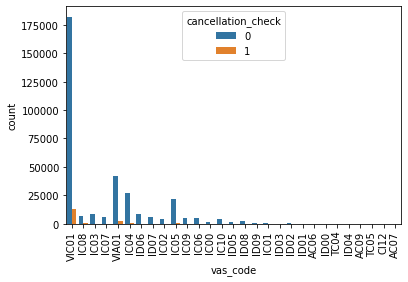

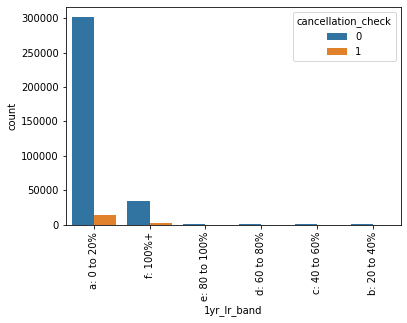

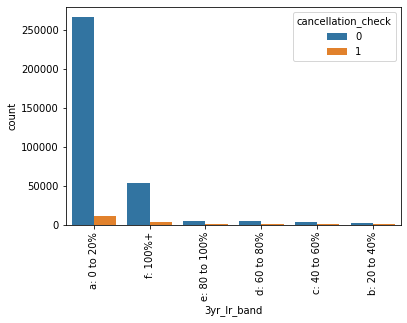

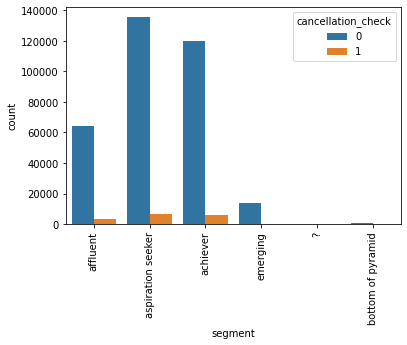

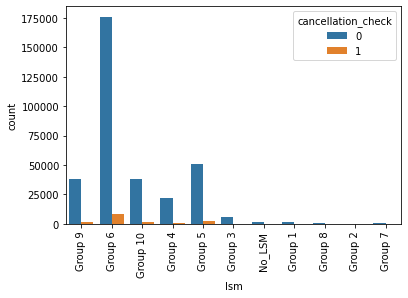

...

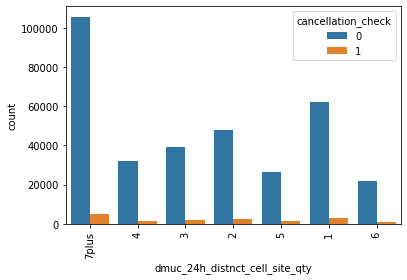

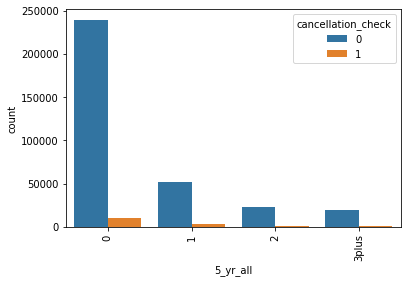

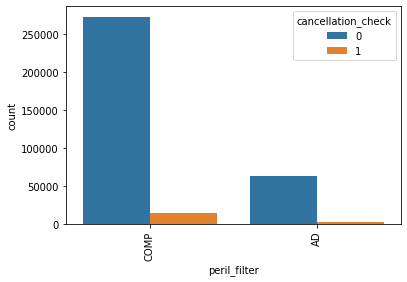

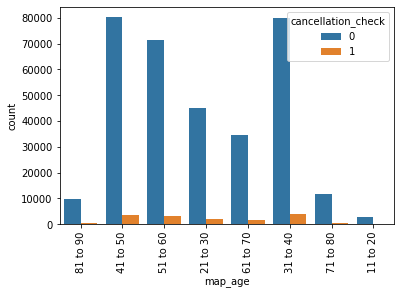

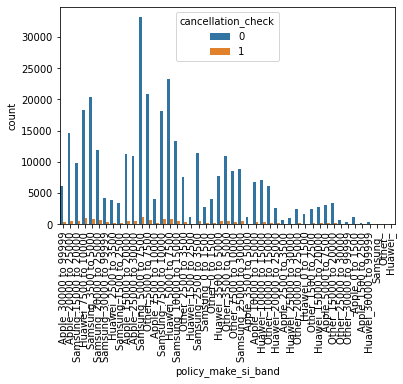

In [104]:
for i, predictor in enumerate(pandas_df[objects]):
    plt.figure(i)
    ax = sns.countplot(data=pandas_df, x=predictor, hue='cancellation_check')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    #cancellation rates

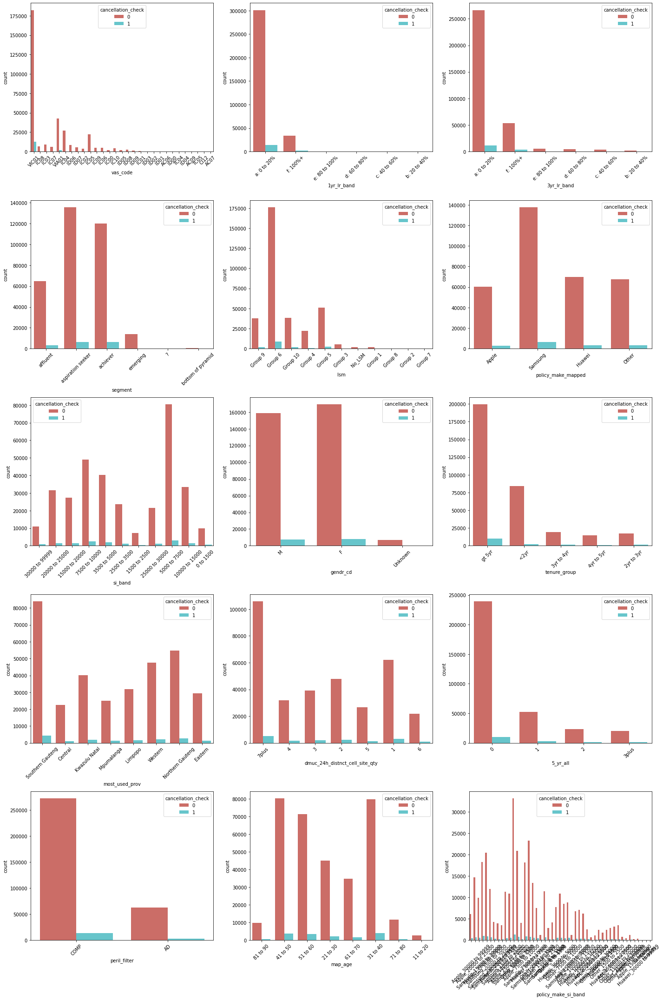

In [45]:
f, axes = plt.subplots(round(len(objects)/3), 3,  figsize=(20, 30))  
y = 0
for name in objects:
    i, j = divmod(y, 3)
    ax = sns.countplot(x = pandas_df[name],data = pandas_df, ax=axes[i, j],  hue='cancellation_check', palette="hls")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
    y = y + 1
plt.tight_layout()
plt.show()



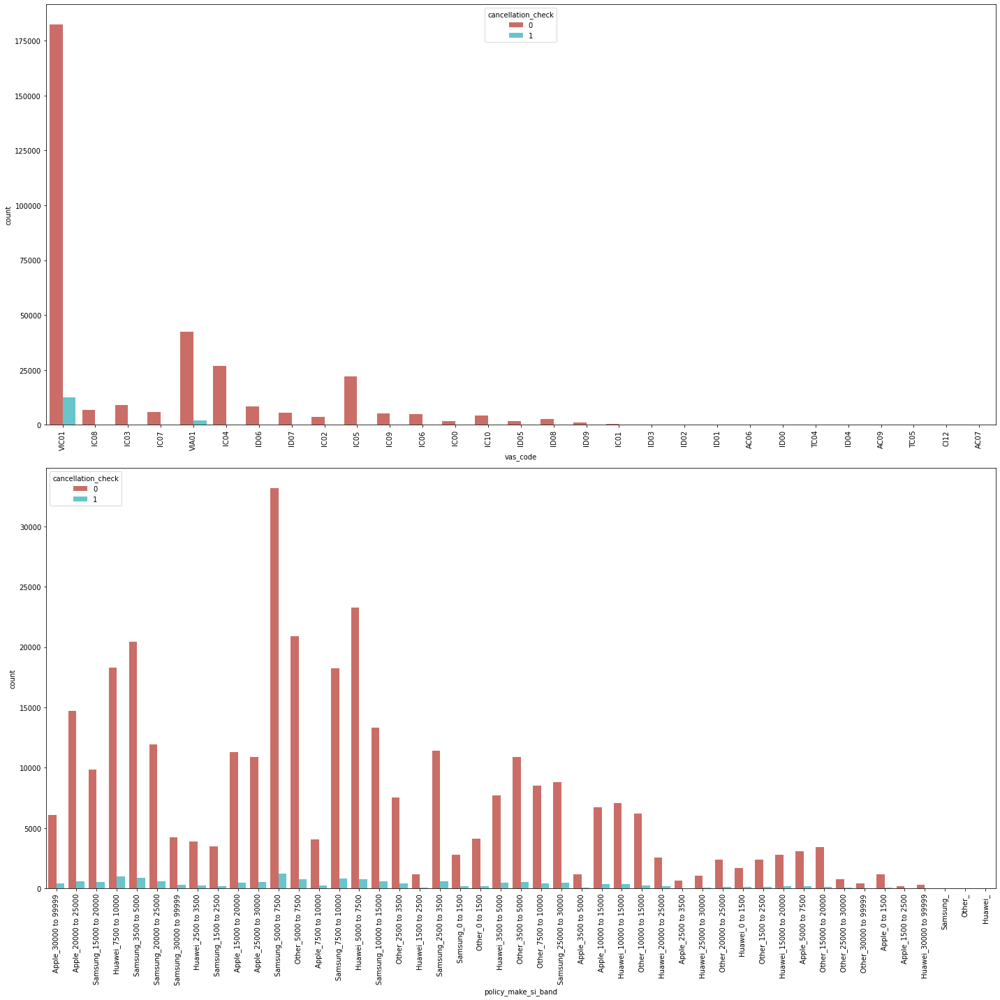

In [47]:
f, axes = plt.subplots(2,1,  figsize=(20, 20))  
y = 0;
vis_objects = ['vas_code','policy_make_si_band']
for name in vis_objects:
    ax = sns.countplot(x = pandas_df[name], data = pandas_df, ax=axes[y], palette="hls", hue="cancellation_check")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    y = y + 1

plt.tight_layout()
plt.show()

In [37]:
pandas_df_woo = pandas_df

# Multivariate Analysis: Non-Graphical

In [38]:
round(pandas_df.corr(),2)

,actual_premium,tenure,one_yr_loss_ratio,three_yr_loss_ratio,lr_increase,tp_2,psr_2,psr_2_increase_loading,premium_increase,new_premium_2,...,three_yr_all,one_yr_claims,three_yr_claims,five_yr_claims,net_th_lo,net_ad_repair,net_ad_replace,ad_loss_of_si,insured_value,cancellation_check
actual_premium,1.00,0.13,0.04,0.03,0.11,0.69,0.00,0.11,0.13,1.00,...,0.03,0.07,0.07,0.07,0.06,0.04,0.02,0.00,0.75,0.03
tenure,0.13,1.00,-0.05,-0.08,0.05,-0.01,-0.01,-0.20,-0.00,0.13,...,0.01,0.00,0.01,0.01,-0.00,0.01,0.00,0.00,0.07,0.07
one_yr_loss_ratio,0.04,-0.05,1.00,0.70,0.57,0.07,-0.00,0.08,0.56,0.05,...,0.03,0.03,0.03,0.03,0.01,0.00,0.00,-0.00,0.02,0.01
three_yr_loss_ratio,0.03,-0.08,0.70,1.00,0.39,0.05,-0.00,0.06,0.39,0.04,...,0.03,0.03,0.03,0.03,0.01,0.00,0.00,0.00,0.02,0.01
lr_increase,0.11,0.05,0.57,0.39,1.00,0.12,-0.00,0.10,0.97,0.14,...,0.07,0.05,0.06,0.06,0.02,0.02,0.01,0.00,0.03,0.04
tp_2,0.69,-0.01,0.07,0.05,0.12,1.00,-0.01,0.54,0.25,0.70,...,0.03,0.07,0.06,0.06,0.06,0.03,0.02,-0.00,0.70,0.02
psr_2,0.00,-0.01,-0.00,-0.00,-0.00,-0.01,1.00,-0.01,-0.00,-0.00,...,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00
psr_2_increase_loading,0.11,-0.20,0.08,0.06,0.10,0.54,-0.01,1.00,0.35,0.12,...,0.03,0.03,0.03,0.02,0.03,0.01,0.01,-0.00,0.11,0.00
premium_increase,0.13,-0.00,0.56,0.39,0.97,0.25,-0.00,0.35,1.00,0.16,...,0.07,0.06,0.06,0.06,0.02,0.02,0.01,0.00,0.06,0.03
new_premium_2,1.00,0.13,0.05,0.04,0.14,0.70,-0.00,0.12,0.16,1.00,...,0.03,0.07,0.08,0.08,0.06,0.04,0.02,0.00,0.75,0.03


# Multivariate Analysis: Graphical

<AxesSubplot:>

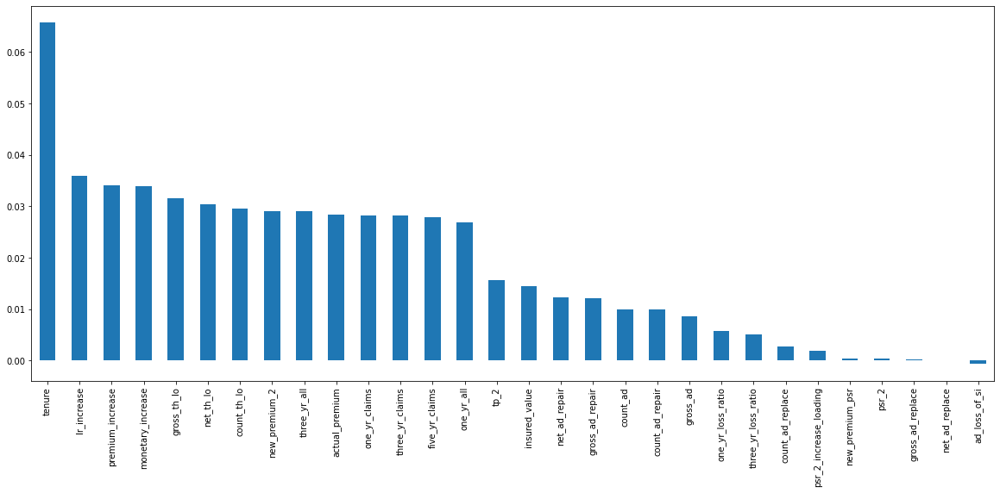

In [49]:
plt.figure(figsize=(20,8))
pandas_df.corr()['cancellation_check'].sort_values(ascending = False)[1:].plot(kind='bar')

In [ ]:
# gross_ad_replace
# net_ad_replace
# ad_loss_of_si
# count_ad_replace

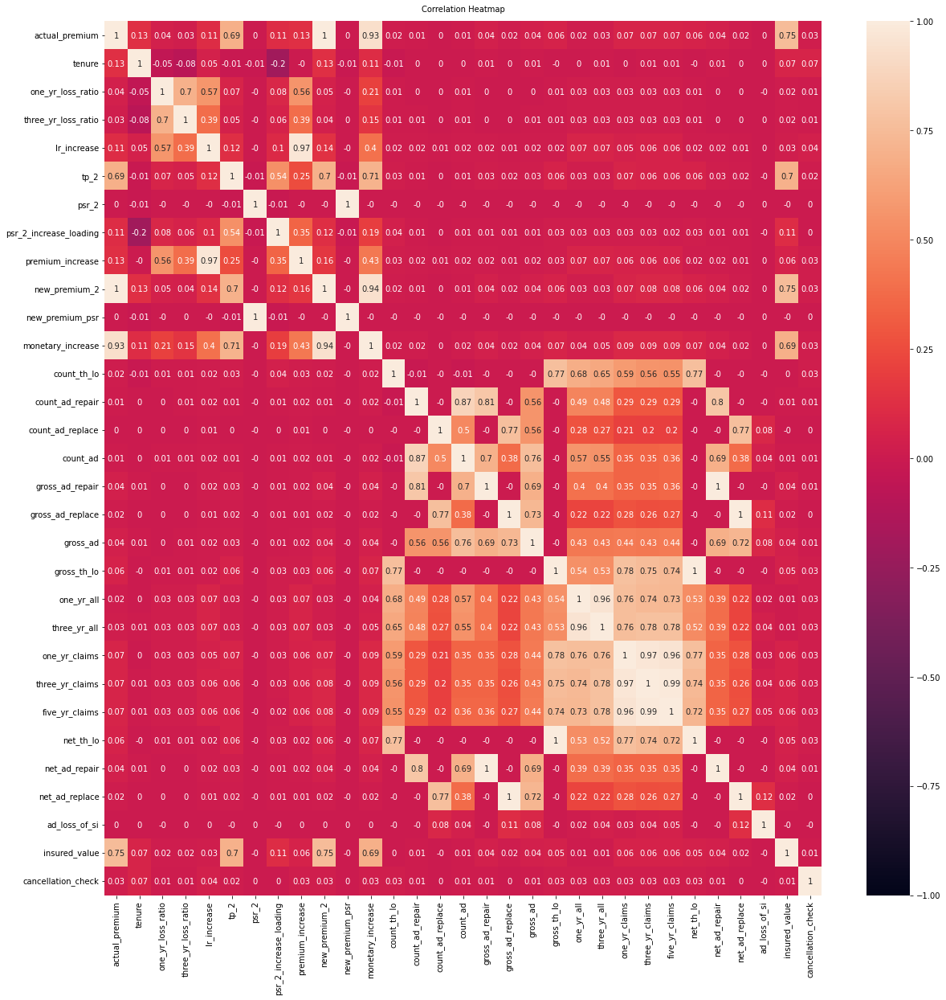

In [50]:
#Heatmap
plt.figure(figsize=(20, 20))
heatmap = sns.heatmap(round(pandas_df.corr(),2), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':10}, pad=12);

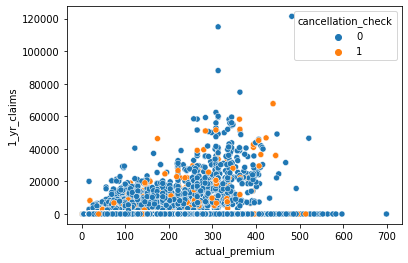

In [110]:
#Scatterplot
sns.scatterplot(x='actual_premium',y='1_yr_claims',hue='cancellation_check', data=pandas_df_woo);

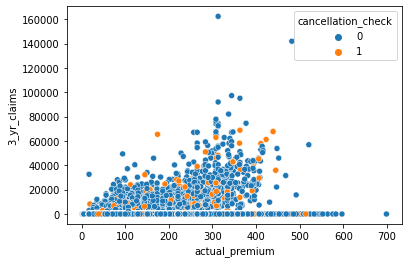

In [111]:
#Scatterplot
sns.scatterplot(x='actual_premium',y='3_yr_claims',hue='cancellation_check', data=pandas_df_woo);

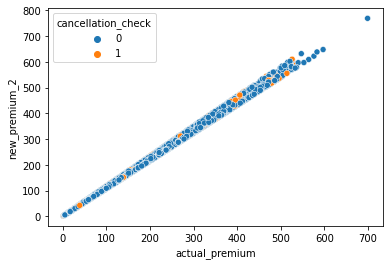

In [112]:
#Scatterplot
sns.scatterplot(x='actual_premium',y='new_premium_2',hue='cancellation_check', data=pandas_df_woo);

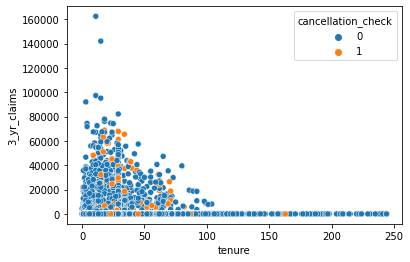

In [113]:
#Scatterplot
sns.scatterplot(x='tenure',y='3_yr_claims',hue='cancellation_check', data=pandas_df_woo);

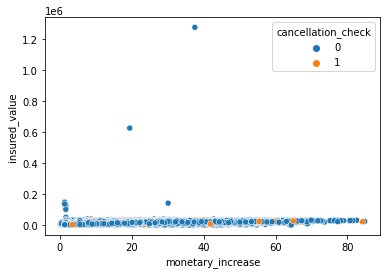

In [114]:
#Scatterplot
sns.scatterplot(x='monetary_increase',y='insured_value',hue='cancellation_check', data=pandas_df_woo);

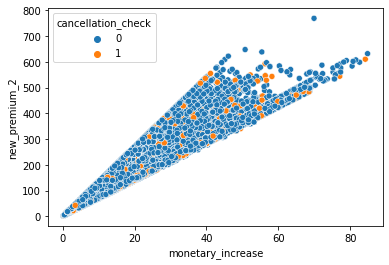

In [115]:
#Scatterplot
sns.scatterplot(x='monetary_increase',y='new_premium_2',hue='cancellation_check', data=pandas_df_woo);

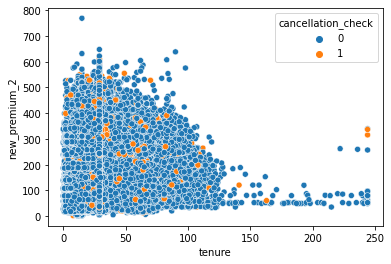

In [116]:
#Scatterplot
sns.scatterplot(x='tenure',y='new_premium_2',hue='cancellation_check', data=pandas_df_woo);

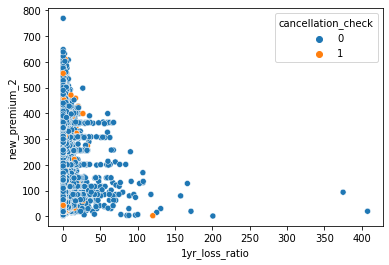

In [117]:
#Scatterplot
sns.scatterplot(x='1yr_loss_ratio',y='new_premium_2',hue='cancellation_check', data=pandas_df_woo);

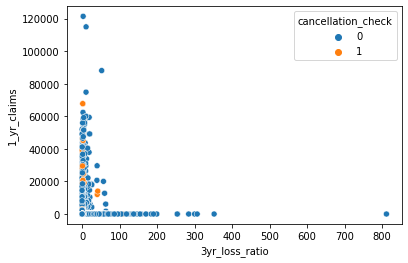

In [118]:
#Scatterplot
sns.scatterplot(x='3yr_loss_ratio',y='1_yr_claims',hue='cancellation_check', data=pandas_df_woo);

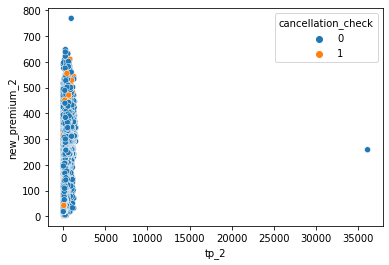

In [119]:
#Scatterplot
sns.scatterplot(x='tp_2',y='new_premium_2',hue='cancellation_check', data=pandas_df_woo);

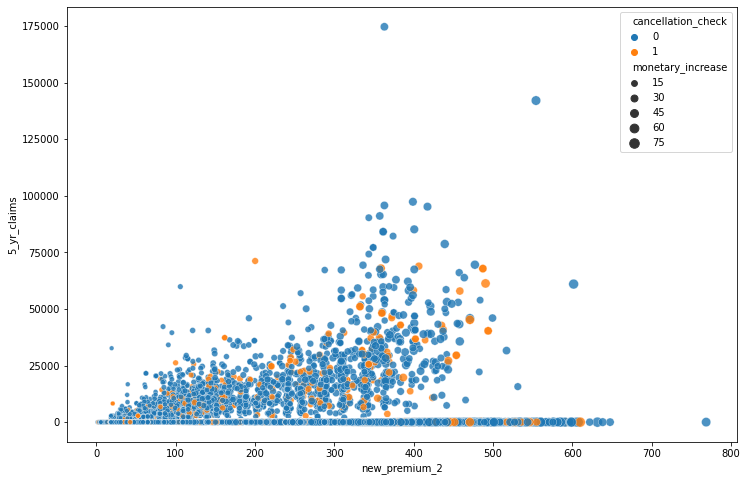

In [120]:
#Bubble Plots
plt.figure(figsize=(12,8))
sns.scatterplot(x="new_premium_2",
                y="5_yr_claims",
                size="monetary_increase",
                sizes=(20,100),
                alpha=0.8,
                hue="cancellation_check",
                data=pandas_df_woo);

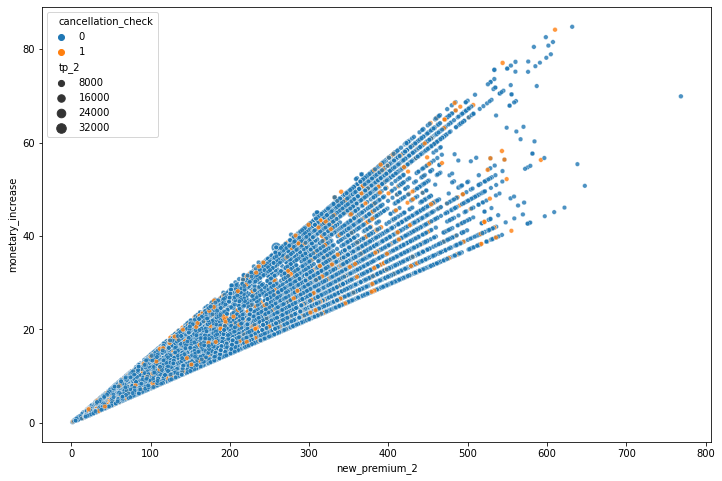

In [121]:
#Bubble Plots
plt.figure(figsize=(12,8))
sns.scatterplot(x="new_premium_2",
                y="monetary_increase",
                size="tp_2",
                sizes=(20,100),
                alpha=0.8,
                hue="cancellation_check",
                data=pandas_df_woo);

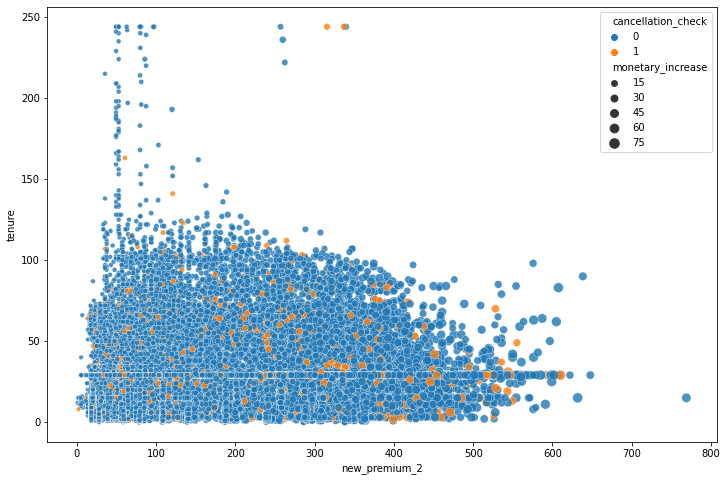

In [122]:
#Bubble Plots
plt.figure(figsize=(12,8))
sns.scatterplot(x="new_premium_2",
                y="tenure",
                size="monetary_increase",
                sizes=(20,100),
                alpha=0.8,
                hue="cancellation_check",
                data=pandas_df_woo);

In [54]:
#Pair Plot
sns.set_style("whitegrid");
plt.figure(figsize=(12, 8))
sns.pairplot(pandas_df_woo[features], hue="cancellation_check");
plt.show();

KeyboardInterrupt: 

<Figure size 864x576 with 0 Axes>

Error in callback <function flush_figures at 0x7ff6fcaf0510> (for post_execute):


KeyboardInterrupt: 

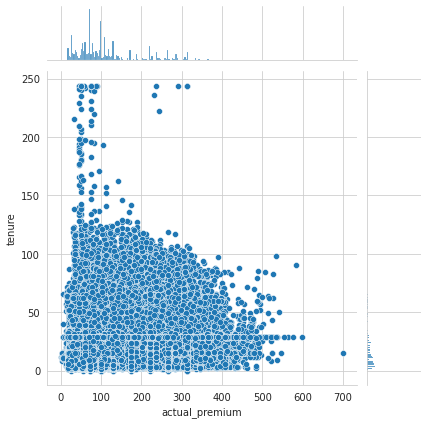

In [55]:
#Joint Plot
sns.jointplot(x = 'actual_premium', y = 'tenure', data = pandas_df_woo)

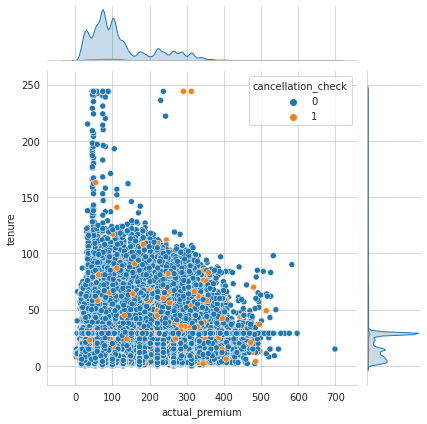

In [56]:
sns.jointplot(x = 'actual_premium', y = 'tenure', data = pandas_df_woo, hue='cancellation_check');

## Feature Selection

In [51]:
chi2_array, p_array = [], []
for column in objects:
    crosstab = pd.crosstab(pandas_df[column], pandas_df['cancellation_check'])
    chi2, p, dof, expected = chi2_contingency(crosstab)
    chi2_array.append(chi2)
    p_array.append(p)
 
df_chi = pd.DataFrame({
    'Variable': objects,
    'Chi-square': chi2_array,
    'p-value': p_array
})
df_chi.sort_values(by='Chi-square', ascending=False)

,Variable,Chi-square,p-value
0,vas_code,4731.983201,0.000000e+00
8,tenure_group,1647.604610,0.000000e+00
2,three_yr_lr_band,722.606316,6.353390e-154
14,policy_make_si_band,662.495966,3.657469e-110
11,five_yr_all,512.725226,8.334101e-111
3,segment,478.202871,4.041334e-101
6,si_band,403.811074,1.454010e-80
1,one_yr_lr_band,269.684520,3.270962e-56
12,peril_filter,203.051204,4.508327e-46
4,lsm,62.663592,1.131549e-09


In [52]:
chi2_array, p_array = [], []
for column in features:
    crosstab = pd.crosstab(pandas_df[column], pandas_df['cancellation_check'])
    chi2, p, dof, expected = chi2_contingency(crosstab)
    chi2_array.append(chi2)
    p_array.append(p)
 
df_chi = pd.DataFrame({
    'Variable': features,
    'Chi-square': chi2_array,
    'p-value': p_array
})
df_chi.sort_values(by='Chi-square', ascending=False)

,Variable,Chi-square,p-value
12,cancellation_check,350976.881615,0.000000e+00
10,new_premium_psr,335789.090799,6.986182e-41
6,psr_2,333142.031530,4.586165e-39
5,tp_2,290063.294567,6.525135e-02
3,three_yr_loss_ratio,88555.792169,0.000000e+00
2,one_yr_loss_ratio,33975.655779,2.455165e-311
16,insured_value,22208.977294,0.000000e+00
9,new_premium_2,14959.165341,0.000000e+00
11,monetary_increase,11823.488490,0.000000e+00
26,five_yr_claims,6595.064785,0.000000e+00


#### drop fearures

In [53]:
feat = ['cancellation_check', 'tenure', 'lr_increase', 'gross_th_lo', 'new_premium_2', 'five_yr_claims', 'map_age', 'policy_make_mapped', 'lsm', 'vas_code', 'three_yr_lr_band']

In [54]:
pandas_drop = pandas_df[feat]

In [62]:
pandas_drop = pandas_df

In [ ]:
# features_drop = ['dmuc_24h_distnct_cell_site_qty', 'psr_2_increase_loading', 'count_ad_replace', 'gross_ad_replace', \
#                  'net_ad_replace', 'ad_loss_of_si']
# pandas_drop = pandas_df.drop(features_drop, axis=1)

### Feature Engeneering

In [55]:
# Finding all the categorical columns from the data
categorical_columns = pandas_drop.select_dtypes('object').columns 
categorical_columns

Index(['map_age', 'policy_make_mapped', 'lsm', 'vas_code', 'three_yr_lr_band'], dtype='object')

In [56]:
 # Finding all the numerical columns from the data
numerical_columns = pandas_drop.select_dtypes(include=['int64', 'int32','float64']).columns
numerical_columns

Index(['cancellation_check', 'tenure', 'lr_increase', 'gross_th_lo',
       'new_premium_2', 'five_yr_claims'],
      dtype='object')

In [57]:
# Making a copy of the data to save the original data
original_df = pandas_drop

In [197]:
pandas_drop = original_df

In [58]:
pandas_drop = pandas_drop.dropna()

In [59]:
# One hot encoding independent variable x
def encode_and_bind(original_dataframe, feature_to_encode):
    dummies = pd.get_dummies(original_dataframe[[feature_to_encode]])
    res = pd.concat([original_dataframe, dummies], axis=1)
    res = res.drop([feature_to_encode], axis=1)
    return(res)

In [60]:
for feature in categorical_columns:
    pandas_drop = encode_and_bind(pandas_drop, feature)

pandas_drop.head()

,cancellation_check,tenure,lr_increase,gross_th_lo,new_premium_2,five_yr_claims,map_age_11 to 20,map_age_21 to 30,map_age_31 to 40,map_age_41 to 50,...,vas_code_TC04,vas_code_TC05,vas_code_VIA01,vas_code_VIC01,three_yr_lr_band_a: 0 to 20%,three_yr_lr_band_b: 20 to 40%,three_yr_lr_band_c: 40 to 60%,three_yr_lr_band_d: 60 to 80%,three_yr_lr_band_e: 80 to 100%,three_yr_lr_band_f: 100%+
0,0,29,0.00,0.0,373.68,0.0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
1,0,5,0.00,0.0,240.89,0.0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
2,0,29,0.00,0.0,393.12,0.0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
3,0,18,0.07,0.0,124.12,0.0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,1
4,0,11,0.00,0.0,81.03,0.0,0,0,0,1,...,0,0,0,1,1,0,0,0,0,0


In [61]:
pandas_drop.shape

(351000, 64)

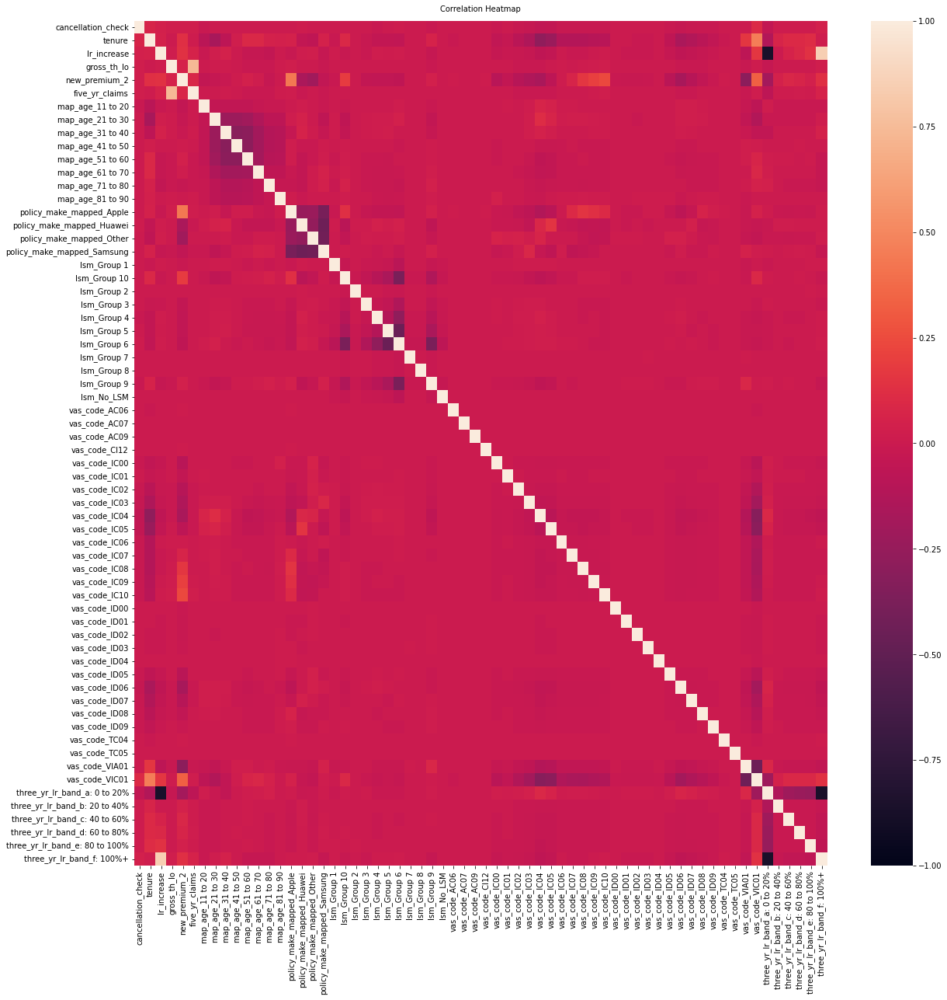

In [62]:
#Heatmap
plt.figure(figsize=(20, 20))
heatmap = sns.heatmap(round(pandas_drop.corr(),2), vmin=-1, vmax=1, annot=False)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':10}, pad=12);

<AxesSubplot:>

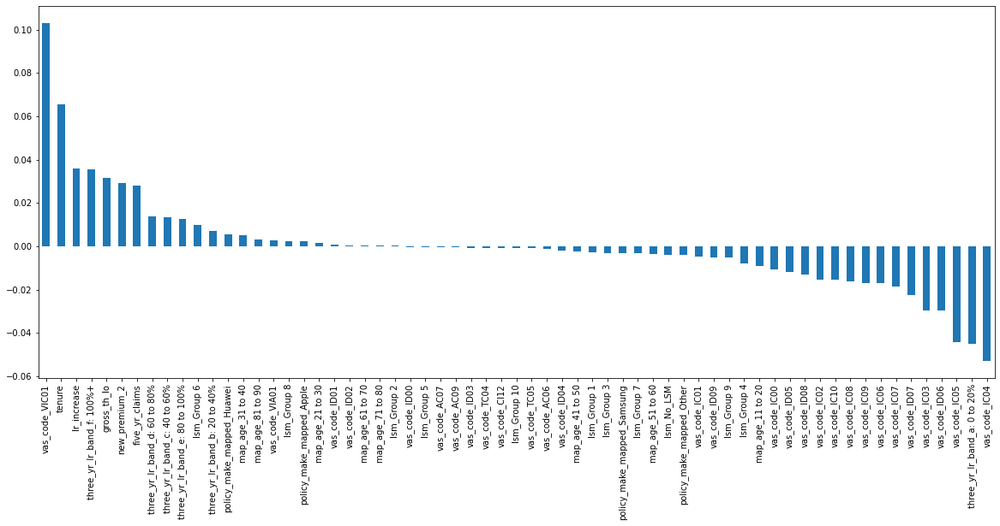

In [63]:
plt.figure(figsize=(20,8))
pandas_drop.corr()['cancellation_check'][1:].sort_values(ascending = False).plot(kind='bar')

In [64]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

#Change variable name separators to '_'
all_columns = [column.replace(" ", "_").replace("(", "_").replace(")", "_").replace("-", "_").replace("+", "")
               .replace("%", "").replace(":", "") 
               for column in pandas_drop.columns]

#Effect the change to the dataframe column names
pandas_drop.columns = all_columns

In [65]:
pandas_drop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 351000 entries, 0 to 350999
Data columns (total 64 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   cancellation_check            351000 non-null  int32  
 1   tenure                        351000 non-null  int32  
 2   lr_increase                   351000 non-null  float64
 3   gross_th_lo                   351000 non-null  float64
 4   new_premium_2                 351000 non-null  float64
 5   five_yr_claims                351000 non-null  float64
 6   map_age_11_to_20              351000 non-null  uint8  
 7   map_age_21_to_30              351000 non-null  uint8  
 8   map_age_31_to_40              351000 non-null  uint8  
 9   map_age_41_to_50              351000 non-null  uint8  
 10  map_age_51_to_60              351000 non-null  uint8  
 11  map_age_61_to_70              351000 non-null  uint8  
 12  map_age_71_to_80              351000 non-nul

In [66]:
pandas_drop.columns

Index(['cancellation_check', 'tenure', 'lr_increase', 'gross_th_lo',
       'new_premium_2', 'five_yr_claims', 'map_age_11_to_20',
       'map_age_21_to_30', 'map_age_31_to_40', 'map_age_41_to_50',
       'map_age_51_to_60', 'map_age_61_to_70', 'map_age_71_to_80',
       'map_age_81_to_90', 'policy_make_mapped_Apple',
       'policy_make_mapped_Huawei', 'policy_make_mapped_Other',
       'policy_make_mapped_Samsung', 'lsm_Group_1', 'lsm_Group_10',
       'lsm_Group_2', 'lsm_Group_3', 'lsm_Group_4', 'lsm_Group_5',
       'lsm_Group_6', 'lsm_Group_7', 'lsm_Group_8', 'lsm_Group_9',
       'lsm_No_LSM', 'vas_code_AC06', 'vas_code_AC07', 'vas_code_AC09',
       'vas_code_CI12', 'vas_code_IC00', 'vas_code_IC01', 'vas_code_IC02',
       'vas_code_IC03', 'vas_code_IC04', 'vas_code_IC05', 'vas_code_IC06',
       'vas_code_IC07', 'vas_code_IC08', 'vas_code_IC09', 'vas_code_IC10',
       'vas_code_ID00', 'vas_code_ID01', 'vas_code_ID02', 'vas_code_ID03',
       'vas_code_ID04', 'vas_code_ID05', '

In [67]:
#Prepare it for the GLM formula
glm_columns = [f'Q("{e}")' for e in all_columns if e not in ['cancellation_check']]
glm_columns = ' + '.join(map(str, glm_columns))

glm_columns

'Q("tenure") + Q("lr_increase") + Q("gross_th_lo") + Q("new_premium_2") + Q("five_yr_claims") + Q("map_age_11_to_20") + Q("map_age_21_to_30") + Q("map_age_31_to_40") + Q("map_age_41_to_50") + Q("map_age_51_to_60") + Q("map_age_61_to_70") + Q("map_age_71_to_80") + Q("map_age_81_to_90") + Q("policy_make_mapped_Apple") + Q("policy_make_mapped_Huawei") + Q("policy_make_mapped_Other") + Q("policy_make_mapped_Samsung") + Q("lsm_Group_1") + Q("lsm_Group_10") + Q("lsm_Group_2") + Q("lsm_Group_3") + Q("lsm_Group_4") + Q("lsm_Group_5") + Q("lsm_Group_6") + Q("lsm_Group_7") + Q("lsm_Group_8") + Q("lsm_Group_9") + Q("lsm_No_LSM") + Q("vas_code_AC06") + Q("vas_code_AC07") + Q("vas_code_AC09") + Q("vas_code_CI12") + Q("vas_code_IC00") + Q("vas_code_IC01") + Q("vas_code_IC02") + Q("vas_code_IC03") + Q("vas_code_IC04") + Q("vas_code_IC05") + Q("vas_code_IC06") + Q("vas_code_IC07") + Q("vas_code_IC08") + Q("vas_code_IC09") + Q("vas_code_IC10") + Q("vas_code_ID00") + Q("vas_code_ID01") + Q("vas_code_ID0

In [68]:
#Fiting it to the Generalized Linear Model
glm_model = smf.glm(formula=f'cancellation_check ~ {glm_columns}', data=pandas_drop, family=sm.families.Binomial())
res = glm_model.fit()
print(res.summary())

/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/statsmodels/genmod/families/links.py:188: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:947: RuntimeWarning: divide by zero encountered in log
  y * np.log(mu / (1 - mu + 1e-20)) +
/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/statsmodels/genmod/families/family.py:947: RuntimeWarning: invalid value encountered in multiply
  y * np.log(mu / (1 - mu + 1e-20)) +


                 Generalized Linear Model Regression Results                  
Dep. Variable:     cancellation_check   No. Observations:               351000
Model:                            GLM   Df Residuals:                   350941
Model Family:                Binomial   Df Model:                           58
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Wed, 22 Nov 2023   Deviance:                   1.4685e+06
Time:                        14:41:25   Pearson chi2:                 7.18e+19
No. Iterations:                    40                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Interc

In [69]:
np.exp(res.params)

/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/pandas/core/series.py:726: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)


Intercept                            0.0
Q("tenure")                          inf
Q("lr_increase")                     0.0
Q("gross_th_lo")                     inf
Q("new_premium_2")                   0.0
                                    ... 
Q("three_yr_lr_band_b_20_to_40")     0.0
Q("three_yr_lr_band_c_40_to_60")     0.0
Q("three_yr_lr_band_d_60_to_80")     0.0
Q("three_yr_lr_band_e_80_to_100")    0.0
Q("three_yr_lr_band_f_100")          0.0
Length: 64, dtype: float64

In [106]:
#feature scaling
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler()
pandas_drop = pd.DataFrame(sc.fit_transform(pandas_drop),columns= pandas_drop.columns)

In [111]:
# Import Machine learning algorithms
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB



#Defining the modelling function
def modeling(alg, alg_name, params={}):
    model = alg(**params) #Instantiating the algorithm class and unpacking parameters if any
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)

    #Performance evaluation
    def print_scores(alg, y_true, y_pred):
        print(alg_name)
        acc_score = accuracy_score(y_true, y_pred)
        print("accuracy: ",acc_score)
        pre_score = precision_score(y_true, y_pred)
        print("precision: ",pre_score)
        rec_score = recall_score(y_true, y_pred)
        print("recall: ",rec_score)
        f_score = f1_score(y_true, y_pred, average='weighted')
        print("f1_score: ",f_score)

    print_scores(alg, y_test, y_pred)
    return model

# Running logistic regression model
log_model = modeling(LogisticRegression, 'Logistic Regression')

/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


Logistic Regression
accuracy:  0.954017094017094
precision:  0.0
recall:  0.0
f1_score:  0.931580597171534


In [70]:
import h2o
from h2o.automl import H2OAutoML

In [71]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/h2o/backend/connection.py:371: UserWarning: Proxy is defined in the environment: http_proxy. This may interfere with your H2O Connection.
  "This may interfere with your H2O Connection." % name)
/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/h2o/backend/connection.py:371: UserWarning: Proxy is defined in the environment: HTTP_PROXY. This may interfere with your H2O Connection.
  "This may interfere with your H2O Connection." % name)


H2O_cluster_uptime:,7 days 3 hours 32 mins
H2O_cluster_timezone:,Africa/Johannesburg
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.36.0.3
H2O_cluster_version_age:,"1 year, 9 months and 5 days !!!"
H2O_cluster_name:,H2O_from_python_ngcox001_m4hkyz
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,25.33 Gb
H2O_cluster_total_cores:,40
H2O_cluster_allowed_cores:,40
H2O_cluster_status:,"locked, healthy"


In [72]:
hf = h2o.H2OFrame(pandas_drop)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [73]:
hf['cancellation_check'] = hf['cancellation_check'].asfactor()
predictors = hf.drop('cancellation_check').columns
response = 'cancellation_check'

### Splitting Datasets

In [74]:
# Split into train and test
train, valid = hf.split_frame(ratios=[.8], seed=1234)

In [75]:
# Add a Stopping Creterias: max number of models and max time
# We are going to exclude DeepLearning algorithms because they are too slow
aml = H2OAutoML(
    max_models=20,
    max_runtime_secs=300,
    seed=1234,
    exclude_algos = ["DeepLearning"]
)

In [76]:
# Train the model
aml.train(x=predictors,
        y=response,
        training_frame=train,
        validation_frame=valid
)

AutoML progress: |
14:41:40.942: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

███████████████████████████████████████████████████████████████| (done) 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_AllModels_1_AutoML_2_20231122_144140

No model summary for this model

ModelMetricsBinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.04092525507943181
RMSE: 0.2022999136911131
LogLoss: 0.15996143252488149
Null degrees of freedom: 9978
Residual degrees of freedom: 9971
Null deviance: 3735.6742428960574
Residual deviance: 3192.5102703315843
AIC: 3208.5102703315843
AUC: 0.8203327728395884
AUCPR: 0.23851350661229814
Gini: 0.6406655456791768

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.0967982785303821: 


,,0,1,Error,Rate
0,0,9119.0,399.0,0.0419,(399.0/9518.0)
1,1,318.0,143.0,0.6898,(318.0/461.0)
2,Total,9437.0,542.0,0.0719,(717.0/9979.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.096798,0.285145,109.0
1,max f2,0.068838,0.385045,175.0
2,max f0point5,0.116437,0.320111,78.0
3,max accuracy,0.304336,0.954905,10.0
4,max precision,0.596164,1.000000,0.0
5,max recall,0.004489,1.000000,385.0
6,max specificity,0.596164,1.000000,0.0
7,max absolute_mcc,0.112194,0.252867,84.0
8,max min_per_class_accuracy,0.058009,0.737550,209.0
9,max mean_per_class_accuracy,0.056100,0.745832,217.0



Gains/Lift Table: Avg response rate:  4.62 %, avg score:  4.47 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010021,0.143031,10.173818,10.173818,0.470000,0.203054,0.470000,0.203054,0.101952,0.101952,917.381779,917.381779,0.096384
1,2,0.020042,0.121934,6.710390,8.442104,0.310000,0.131165,0.390000,0.167110,0.067245,0.169197,571.039046,744.210412,0.156380
2,3,0.030063,0.110666,5.411605,7.431938,0.250000,0.115591,0.343333,0.149937,0.054230,0.223427,441.160521,643.193782,0.202730
3,4,0.040084,0.103897,3.679892,6.493926,0.170000,0.106925,0.300000,0.139184,0.036876,0.260304,267.989154,549.392625,0.230886
4,5,0.050005,0.098224,3.717062,5.943005,0.171717,0.100748,0.274549,0.131558,0.036876,0.297180,271.706216,494.300532,0.259147
5,6,0.100010,0.082457,2.429258,4.186131,0.112224,0.089500,0.193387,0.110529,0.121475,0.418655,142.925765,318.613148,0.334079
6,7,0.150015,0.072343,2.559396,3.643886,0.118236,0.076904,0.168337,0.099321,0.127983,0.546638,155.939645,264.388647,0.415833
7,8,0.200020,0.065486,1.691804,3.155866,0.078156,0.068689,0.145792,0.091663,0.084599,0.631236,69.180443,215.586596,0.452102
8,9,0.300030,0.056968,1.323078,2.544937,0.061122,0.060648,0.117568,0.081325,0.132321,0.763557,32.307783,154.493658,0.485978
9,10,0.400040,0.051655,0.910972,2.136445,0.042084,0.054213,0.098697,0.074547,0.091106,0.854664,-8.902838,113.644534,0.476643




ModelMetricsBinomialGLM: stackedensemble
** Reported on validation data. **

MSE: 0.043051023765025134
RMSE: 0.20748740628053822
LogLoss: 0.1740580694214823
Null degrees of freedom: 70005
Residual degrees of freedom: 69998
Null deviance: 26273.7664956838
Residual deviance: 24370.218415840576
AIC: 24386.218415840576
AUC: 0.700527436266281
AUCPR: 0.09969075909659
Gini: 0.401054872532562

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.07977772721513333: 


,,0,1,Error,Rate
0,0,59778.0,6983.0,0.1046,(6983.0/66761.0)
1,1,2380.0,865.0,0.7334,(2380.0/3245.0)
2,Total,62158.0,7848.0,0.1337,(9363.0/70006.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.079778,0.155954,175.0
1,max f2,0.051324,0.260304,260.0
2,max f0point5,0.098935,0.133474,138.0
3,max accuracy,0.364352,0.953690,22.0
4,max precision,0.434967,0.550000,12.0
5,max recall,0.001654,1.000000,398.0
6,max specificity,0.685772,0.999985,0.0
7,max absolute_mcc,0.037225,0.125409,307.0
8,max min_per_class_accuracy,0.053232,0.627926,253.0
9,max mean_per_class_accuracy,0.037225,0.644151,307.0



Gains/Lift Table: Avg response rate:  4.64 %, avg score:  4.51 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010013,0.140646,4.062342,4.062342,0.188302,0.196010,0.188302,0.196010,0.040678,0.040678,306.234193,306.234193,0.032155
1,2,0.020027,0.120530,2.431250,3.246796,0.112696,0.128995,0.150499,0.162502,0.024345,0.065023,143.125010,224.679601,0.047183
2,3,0.030112,0.110555,2.536261,3.008827,0.117564,0.115510,0.139469,0.146764,0.025578,0.090601,153.626106,200.882748,0.063429
3,4,0.040025,0.103946,2.269258,2.825651,0.105187,0.107155,0.130978,0.136954,0.022496,0.113097,126.925840,182.565084,0.076624
4,5,0.050010,0.098985,2.870294,2.834564,0.133047,0.101477,0.131391,0.129871,0.028659,0.141757,187.029368,183.456411,0.096206
5,6,0.100006,0.082207,1.972434,2.403561,0.091429,0.089873,0.111413,0.109875,0.098613,0.240370,97.243407,140.356066,0.147187
6,7,0.150001,0.072558,1.621094,2.142763,0.075143,0.077090,0.099324,0.098947,0.081048,0.321418,62.109425,114.276336,0.179748
7,8,0.200011,0.066209,1.602145,2.007589,0.074264,0.069259,0.093058,0.091524,0.080123,0.401541,60.214493,100.758945,0.211325
8,9,0.300003,0.057682,1.251263,1.755505,0.058000,0.061502,0.081373,0.081518,0.125116,0.526656,25.126287,75.550460,0.237670
9,10,0.400009,0.052381,1.266492,1.633247,0.058706,0.054908,0.075706,0.074865,0.126656,0.653313,26.649158,63.324698,0.265616




ModelMetricsBinomialGLM: stackedensemble
** Reported on cross-validation data. **

MSE: 0.04190865987059709
RMSE: 0.20471604692988063
LogLoss: 0.1704421266087569
Null degrees of freedom: 280993
Residual degrees of freedom: 280986
Null deviance: 103224.35201491149
Residual deviance: 95786.42984860207
AIC: 95802.42984860207
AUC: 0.704649590013427
AUCPR: 0.09862130704982097
Gini: 0.40929918002685395

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.06923680061569712: 


,,0,1,Error,Rate
0,0,223607.0,44729.0,0.1667,(44729.0/268336.0)
1,1,7952.0,4706.0,0.6282,(7952.0/12658.0)
2,Total,231559.0,49435.0,0.1875,(52681.0/280994.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.069237,0.151579,209.0
1,max f2,0.050398,0.259267,267.0
2,max f0point5,0.104835,0.128914,141.0
3,max accuracy,0.433030,0.955028,20.0
4,max precision,0.701698,1.000000,0.0
5,max recall,0.000326,1.000000,399.0
6,max specificity,0.701698,1.000000,0.0
7,max absolute_mcc,0.045360,0.120327,284.0
8,max min_per_class_accuracy,0.053695,0.636909,256.0
9,max mean_per_class_accuracy,0.045360,0.644780,284.0



Gains/Lift Table: Avg response rate:  4.50 %, avg score:  4.50 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010000,0.140836,3.942087,3.942087,0.177580,0.196787,0.177580,0.196787,0.039422,0.039422,294.208678,294.208678,0.030809
1,2,0.020000,0.120478,2.606991,3.274539,0.117438,0.129015,0.147509,0.162901,0.026070,0.065492,160.699126,227.453902,0.047638
2,3,0.030001,0.110284,2.646491,3.065190,0.119217,0.114919,0.138078,0.146907,0.026465,0.091958,164.649113,206.518972,0.064880
3,4,0.040001,0.103679,2.488492,2.921015,0.112100,0.106757,0.131584,0.136869,0.024885,0.116843,148.849166,192.101521,0.080467
4,5,0.050001,0.098744,2.235693,2.783951,0.100712,0.101115,0.125409,0.129718,0.022357,0.139201,123.569251,178.395067,0.093407
5,6,0.100002,0.082251,2.023973,2.403962,0.091174,0.089698,0.108292,0.109708,0.101201,0.240401,102.397321,140.396194,0.147022
6,7,0.150000,0.072722,1.709676,2.172544,0.077016,0.077118,0.097867,0.098845,0.085480,0.325881,70.967595,117.254426,0.184178
7,8,0.200001,0.066252,1.641614,2.039809,0.073950,0.069281,0.091888,0.091454,0.082082,0.407963,64.161450,103.980946,0.217773
8,9,0.299999,0.057787,1.368324,1.815984,0.061639,0.061676,0.081805,0.081528,0.136830,0.544794,36.832411,81.598366,0.256342
9,10,0.400001,0.052247,1.207906,1.663962,0.054413,0.054894,0.074957,0.074869,0.120793,0.665587,20.790595,66.396153,0.278114


In [77]:
# View the AutoML Leaderboard
lb = aml.leaderboard
lb.head(rows=5)  # Print the first 5 rows

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_AllModels_1_AutoML_2_20231122_144140,0.70465,0.170442,0.0986213,0.397455,0.204716,0.0419087
StackedEnsemble_BestOfFamily_2_AutoML_2_20231122_144140,0.70347,0.170533,0.0983426,0.404938,0.204732,0.0419153
GBM_3_AutoML_2_20231122_144140,0.701059,0.171019,0.0950254,0.416372,0.204926,0.0419945
GBM_2_AutoML_2_20231122_144140,0.700813,0.171061,0.0945463,0.408277,0.204931,0.0419967
StackedEnsemble_BestOfFamily_1_AutoML_2_20231122_144140,0.698794,0.171249,0.0913945,0.410624,0.205042,0.042042


In [78]:
import plotly.express as px
lb = lb.as_data_frame()
lb['model_type'] = lb['model_id'].apply(lambda x: x.split('_')[0])
fig = px.bar(
    lb, 
    x='model_id',
    y='auc',
    color='model_type'
)
# fig.update_yaxes(range=[0.999, 1])
fig.show()

In [159]:
# Split the dataset into the response, y, and features, X
y = pandas_drop['cancellation_check']
X = pandas_drop.drop('cancellation_check', axis=1)

In [160]:
#We can then call the train_test_split function:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=50)

KeyError: 'map_age'

In [ ]:
hf['class'] = hf[''cancellation_check''].asfactor()
predictors = hf.drop('class').columns
response = 'class'

In [163]:
aml = H2OAutoML(max_models=20, seed=1)
aml.train(x=x_train, y=pd.DataFrame(y_train), training_frame=pandas_drop)

H2OTypeError: Argument `y` should be an integer | string, got DataFrame         cancellation_check
267038                   0
66521                    0
341486                   0
38154                    0
344205                   0
...                    ...
317510                   0
321502                   0
153709                   0
239499                   0
103904                   0

[280800 rows x 1 columns]

In [148]:
y_train

267038    0.0
66521     0.0
341486    0.0
38154     0.0
344205    0.0
         ... 
317510    0.0
321502    0.0
153709    0.0
239499    0.0
103904    0.0
Name: cancellation_check, Length: 280800, dtype: float64

In [107]:
y_train.value_counts()

0    268124
1     12676
Name: cancellation_check, dtype: int64

In [116]:
x_train.columns = X.columns.str.translate("".maketrans({"[":"{", "]":"}","<":"^"}))

In [117]:
# Transform the dataset (only training data)
oversample = SMOTE()
x_up, y_up = oversample.fit_resample(x_train, y_train)

In [118]:
y_up.value_counts()

1.0    268124
0.0    268124
Name: cancellation_check, dtype: int64

In [119]:
x_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 280800 entries, 267038 to 103904
Data columns (total 63 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   tenure                        280800 non-null  float64
 1   lr_increase                   280800 non-null  float64
 2   gross_th_lo                   280800 non-null  float64
 3   new_premium_2                 280800 non-null  float64
 4   five_yr_claims                280800 non-null  float64
 5   map_age_11_to_20              280800 non-null  float64
 6   map_age_21_to_30              280800 non-null  float64
 7   map_age_31_to_40              280800 non-null  float64
 8   map_age_41_to_50              280800 non-null  float64
 9   map_age_51_to_60              280800 non-null  float64
 10  map_age_61_to_70              280800 non-null  float64
 11  map_age_71_to_80              280800 non-null  float64
 12  map_age_81_to_90              280800 no

In [134]:
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.under_sampling import RandomUnderSampler

from imblearn.pipeline import Pipeline

from collections import Counter

In [135]:
over = BorderlineSMOTE(sampling_strategy=0.3)
under = RandomUnderSampler(sampling_strategy=0.6)

steps = [('o', over), ('u', under)]

In [136]:
pipeline = Pipeline(steps=steps)

# transform the dataset
x_sm_us, y_sm_us = pipeline.fit_resample(x_train, y_train)

print(Counter(y_train))
print(Counter(y_sm_us))

Counter({0.0: 268124, 1.0: 12676})
Counter({0.0: 134061, 1.0: 80437})


In [139]:
pip install plotly

     |████████████████████████████████| 15.6 MB 1.6 MB/s            
Note: you may need to restart the kernel to use updated packages.


In [142]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [143]:
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "pie"}, {"type": "pie"}]])

fig.add_trace(
    go.Pie(labels=list(Counter(y_train).keys()), values=list(Counter(y_train).values()), name='Original Data'),
    row=1, col=1
)

fig.add_trace(
    go.Pie(labels=list(Counter(y_sm_us).keys()), values=list(Counter(y_sm_us).values()), name='SMOTE and US data'),
    row=1, col=2
)

fig.update_traces(textposition='inside', hole=.4, hoverinfo="percent+name+value")
fig.update_layout(
    title_text="Class distribution",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Original', x=0.16, y=0.5, font_size=12, showarrow=False),
                 dict(text='SMOTE and UnderSample', x=0.9, y=0.5, font_size=12, showarrow=False)])
fig.show()

In [144]:
classifier = XGBClassifier(random_state=1234)
classifier.fit(x_sm_us, y_sm_us)

/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[11:09:51] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=40,
              num_parallel_tree=1, predictor='auto', random_state=1234,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [145]:
# Predicting the test set
y_pred = classifier.predict(x_test)

# Making the confusion matrix and calculating accuracy score
accuracy = metrics.accuracy_score(y_test, y_pred)
print(accuracy)

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)
auc = metrics.auc(fpr, tpr)
print(auc)

0.9429059829059829
0.5105392364477541


In [85]:
# x_train.columns[X.columns.str.contains("[\[\]<]")]

Index([], dtype='object')

In [86]:
y_train

267038    0
66521     0
341486    0
38154     0
344205    0
         ..
317510    0
321502    0
153709    0
239499    0
103904    0
Name: cancellation_check, Length: 280800, dtype: int32

### XGBClassifier

In [120]:
from xgboost import XGBClassifier

classifier_1 = XGBClassifier(random_state=1234)
classifier_1.fit(x_train,y_train)

/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:42:46] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=40,
              num_parallel_tree=1, predictor='auto', random_state=1234,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [121]:
from sklearn import metrics

# Predicting the test set
y_pred = classifier_1.predict(x_test)

# Making the confusion matrix and calculating accuracy score
accuracy = metrics.accuracy_score(y_test, y_pred)
print(accuracy)

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)
auc = metrics.auc(fpr, tpr)
print(auc)

0.9539601139601139
0.5017323952373149


In [122]:
xgbpred_1 = classifier_1.predict(x_test)
print(classification_report(y_test, xgbpred_1))

              precision    recall  f1-score   support

         0.0       0.95      1.00      0.98     66973
         1.0       0.41      0.00      0.01      3227

    accuracy                           0.95     70200
   macro avg       0.68      0.50      0.49     70200
weighted avg       0.93      0.95      0.93     70200



In [90]:

print ('Confusion Matrix:')
print(confusion_matrix(y_test, xgbpred_1))
print('\nAccuracy:', accuracy_score(y_test, xgbpred_1))
print("Overall Precision:",precision_score(y_test, xgbpred_1))
print("Overall Recall:",recall_score(y_test, xgbpred_1))
print("Overall f1-score:", f1_score(y_test, xgbpred_1))
auc = roc_auc_score(y_test,xgbpred_1)
plt.show()

Confusion Matrix:
[[66956    17]
 [ 3215    12]]

Accuracy: 0.9539601139601139
Overall Precision: 0.41379310344827586
Overall Recall: 0.0037186241090796405
Overall f1-score: 0.007371007371007371


In [123]:
from xgboost import XGBClassifier

classifier_2 = XGBClassifier(random_state=1234)
classifier_2.fit(x_up, y_up)

/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:44:33] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=40,
              num_parallel_tree=1, predictor='auto', random_state=1234,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [124]:
# Predicting the test set
y_pred = classifier_2.predict(x_test)

# Making the confusion matrix and calculating accuracy score
accuracy = metrics.accuracy_score(y_test, y_pred)
print(accuracy)

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)
auc = metrics.auc(fpr, tpr)
print(auc)

0.8968518518518519
0.5178152399948454


In [125]:
xgbpred_2 = classifier_2.predict(x_test)
print(classification_report(y_test, xgbpred_2 ))

              precision    recall  f1-score   support

         0.0       0.96      0.94      0.95     66973
         1.0       0.07      0.10      0.08      3227

    accuracy                           0.90     70200
   macro avg       0.51      0.52      0.51     70200
weighted avg       0.91      0.90      0.91     70200



In [126]:
print ('Confusion Matrix:')
print(confusion_matrix(y_test, xgbpred_2))
print('\nAccuracy:', accuracy_score(y_test, xgbpred_2))
print("Overall Precision:",precision_score(y_test, xgbpred_2))
print("Overall Recall:",recall_score(y_test, xgbpred_2))
print("Overall f1-score:", f1_score(y_test, xgbpred_2))
auc = roc_auc_score(y_test,xgbpred_2)
plt.show()

Confusion Matrix:
[[62635  4338]
 [ 2903   324]]

Accuracy: 0.8968518518518519
Overall Precision: 0.0694980694980695
Overall Recall: 0.1004028509451503
Overall f1-score: 0.082139688173406


### RandomForestClassifier

In [127]:
from sklearn.ensemble import RandomForestClassifier

rf_1 = RandomForestClassifier(random_state=1234)
rf_1.fit(x_train,y_train)

RandomForestClassifier(random_state=1234)

In [128]:
rf_1_pred = rf_1.predict(x_test)
print(classification_report(y_test, rf_1_pred))

              precision    recall  f1-score   support

         0.0       0.96      0.99      0.97     66973
         1.0       0.16      0.05      0.08      3227

    accuracy                           0.94     70200
   macro avg       0.56      0.52      0.53     70200
weighted avg       0.92      0.94      0.93     70200



In [129]:

print ('Confusion Matrix:')
print(confusion_matrix(y_test, rf_1_pred))
print('\nAccuracy:', accuracy_score(y_test, rf_1_pred))
print("Overall Precision:",precision_score(y_test, rf_1_pred))
print("Overall Recall:",recall_score(y_test, rf_1_pred))
print("Overall f1-score:", f1_score(y_test, rf_1_pred))
auc = roc_auc_score(y_test,rf_1_pred)
plt.show()

Confusion Matrix:
[[66076   897]
 [ 3052   175]]

Accuracy: 0.9437464387464387
Overall Precision: 0.16324626865671643
Overall Recall: 0.05422993492407809
Overall f1-score: 0.08141428239125378


In [130]:
rf = RandomForestClassifier(random_state=1234)
rf.fit(x_up, y_up)

RandomForestClassifier(random_state=1234)

In [131]:
rfpred = rf.predict(x_test)
print(classification_report(y_test, rfpred))

              precision    recall  f1-score   support

         0.0       0.96      0.91      0.93     66973
         1.0       0.08      0.16      0.11      3227

    accuracy                           0.88     70200
   macro avg       0.52      0.54      0.52     70200
weighted avg       0.92      0.88      0.90     70200



In [132]:
ypred = rfpred
model = rf
print ('Confusion Matrix:')
print(confusion_matrix(y_test, ypred))
print('\nAccuracy:', accuracy_score(y_test, ypred))
print("Overall Precision:",precision_score(y_test, ypred))
print("Overall Recall:",recall_score(y_test, ypred))
print("Overall f1-score:", f1_score(y_test, ypred))
auc = roc_auc_score(y_test,ypred)
plt.show()

Confusion Matrix:
[[61007  5966]
 [ 2708   519]]

Accuracy: 0.8764387464387464
Overall Precision: 0.08003084040092522
Overall Recall: 0.16083049271769445
Overall f1-score: 0.10687808896210874


### variable importance

In [103]:
feature_names = list(x_train.columns)

In [104]:
features_to_plot = 35

importances = rf_clf.feature_importances_
indices = np.argsort(importances)

best_vars = np.array(feature_names)[indices][-features_to_plot:]
values = importances[indices][-features_to_plot:]
best_vars

NameError: name 'rf_clf' is not defined

In [ ]:
y_ticks = np.arange(0, features_to_plot)
fig, ax = plt.subplots()
ax.barh(y_ticks, values)
ax.set_yticklabels(best_vars)
ax.set_yticks(y_ticks)
ax.set_title("Random Forest Feature Importances")
fig.tight_layout()
plt.show()

In [ ]:
pandas_df['monetary_increase']